In [1]:
import os
import gzip
from sh import gunzip
import numpy as np
import pandas as pd
import gzip
import nibabel as nib
import matplotlib.pyplot as plt
import io
import torch
import torch.utils 
from torch.autograd import Variable
from torch.utils.data import DataLoader
import torch.nn.functional as F
import torch.nn as nn
from sklearn import preprocessing
from scipy import ndimage as nd
import time
import torch as torch
import glob
from scipy import ndimage as nd
import imgaug as ia
from imgaug import augmenters as iaa
from tensorboardX import SummaryWriter

from Brats_dataset_raw import BraTS_FLAIR_Raw 
hgg_dir='/Users/admin/Downloads/MICCAI_BraTS_2018_Data_Training/HGG/'
lgg_dir='/Users/admin/Downloads/MICCAI_BraTS_2018_Data_Training/LGG/'
csv_dir='/Users/admin/Downloads/MICCAI_BraTS_2018_Data_Training/brats.csv'
brats = pd.read_csv('/Users/admin/Downloads/MICCAI_BraTS_2018_Data_Training/brats.csv')

/Users/admin/anaconda2/lib/python2.7/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


os


In [2]:
def standardizer(img):
    
    mean=np.mean(img)
    std=np.std(img)

    img=img-mean
    img=img/std

    return(img)

def one_hot(a):
    g1=a[:,:,:]==0
    g2=a[:,:,:]==1
    g3=a[:,:,:]==2
    g4=a[:,:,:]==3
    return torch.stack((g1,g2,g3,g4),0)


# def noisy(image): # only for inputs
        
#         row,col,ch= image.shape
#         mean = 0
#         var = 0.3
#         sigma = var
#         gauss = np.random.normal(mean,sigma,(row,col,ch))
#         gauss = gauss.reshape(row,col,ch)
        
#         noisy = image + gauss
#         noisy = nd.gaussian_filter(noisy, sigma=(3, 3, 3), order=0)

#         return noisy
     

def read_img(flair,t1,t1ce,t2,seg,mode='train'):
            flair = nib.load(flair)   # read image
            t1 = nib.load(t1)
            t1ce = nib.load(t1ce)
            t2 = nib.load(t2)
            seg = nib.load(seg)

            # convert to np with .dataobj
            flair = np.array(flair.dataobj) ; t1 = np.array(t1.dataobj) ; t1ce= np.array(t1ce.dataobj) ; t2 = np.array(t2.dataobj) 
            seg = np.array(seg.dataobj)  
                
            # normalise
#             flair=standardizer(flair) ; t1=standardizer(t1); t1ce=standardizer(t1ce); t2=standardizer(t2)

            
#             zoom=0.41

#             flair = nd.interpolation.zoom(flair, zoom=zoom)   
#             t1 = nd.interpolation.zoom(t1, zoom=zoom)
#             t1ce = nd.interpolation.zoom(t1ce, zoom=zoom)
#             t2 = nd.interpolation.zoom(t2, zoom=zoom)
#             seg = nd.interpolation.zoom(seg, zoom=zoom)

            img=np.stack([flair,t1,t1ce,t2])

#             if mode =='train':
#                 concat=np.concatenate([flair,t1,t1ce,t2],axis=2) 
#                 img=self.noisy(concat)
            # concat_full=np.concatenate([concat,seg],axis=2)
#             images_aug=self.seq_seg.augment_images(concat_full)
            # images_aug=concat_full

            seg_orig=np.clip(seg.copy(),0,4)      # <- size=[bs,96,96,54] class number as pixel value

            seg=one_hot(seg_orig)

            return(img,seg,seg_orig)

brats = pd.read_csv(csv_dir)


def zipper(flair,t1,t1ce,t2,seg):
    try:    # unzip if not already unzipped
        gunzip(flair)
    except:
        pass
    try:
        gunzip(t1)
    except:
        pass
    try:
        gunzip(t1ce)
    except:
        pass
    try:
        gunzip(t2)
    except:
        pass
    try:
        gunzip(seg)
    except:
        pass

class BraTS_FLAIR_Raw(torch.utils.data.Dataset):


    def __init__(self, csv_file, root_dir, transform=None,val=False): # error in i=0,77 missing
        """
        Args:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        brats = pd.read_csv(csv_file)
        
        self.brats = brats
        
        self.brats=self.brats.iloc[1:,:]   
        self.root_dir = root_dir
        self.transform = transform
        self.val=val

      
    def __len__(self):
        return len(self.brats)
    
 

        
    def read_img(self, flair,t1,t1ce,t2,seg):
            import os
            ####################################
            ###### regular processing###########
            ####################################
            flair = nib.load(flair)   # read image
            t1 = nib.load(t1)
            t1ce = nib.load(t1ce)
            t2 = nib.load(t2)
            seg = nib.load(seg)
            
            flair = np.array(flair.dataobj) # convert to np with .dataobj
            t1 = np.array(t1.dataobj)
            t1ce= np.array(t1ce.dataobj)
            t2 = np.array(t2.dataobj)
            seg = np.array(seg.dataobj)
            seg[seg==4]=3
            
 
            img=np.stack([flair,t1,t1ce,t2])
            seg_orig=torch.from_numpy(seg) # convert to torch
            seg=one_hot(seg_orig)
            return(img,seg,seg_orig)
    

    def __getitem__(self, idx): 

        if idx==0:
            idx=np.random.randint(100)

        try:
            folder=os.path.join(hgg_dir,self.brats.iloc[idx, 0])# patient folder   # create if loop for hgg/lgg
        except:
            folder=os.path.join(lgg_dir,self.brats.iloc[idx, 0])
            
        flair=folder+'/'+str(self.brats.iloc[idx, 0])+'_flair.nii.gz'  # check zip files
        t1=folder+'/'+str(self.brats.iloc[idx, 0])+'_t1.nii.gz'
        t1ce=folder+'/'+str(self.brats.iloc[idx, 0])+'_t1ce.nii.gz'
        t2=folder+'/'+str(self.brats.iloc[idx, 0])+'_t2.nii.gz'
        seg=folder+'/'+str(self.brats.iloc[idx, 0])+'_seg.nii.gz'

        zipper(flair,t1,t1ce,t2,seg)

        flair=folder+'/'+str(self.brats.iloc[idx, 0])+'_flair.nii'  # image files location
        t1=folder+'/'+str(self.brats.iloc[idx, 0])+'_t1.nii'
        t1ce=folder+'/'+str(self.brats.iloc[idx, 0])+'_t1ce.nii'
        t2=folder+'/'+str(self.brats.iloc[idx, 0])+'_t2.nii'
        seg=folder+'/'+str(self.brats.iloc[idx, 0])+'_seg.nii'


        img,seg,seg_orig= self.read_img(flair=flair,t1=t1,t1ce=t1ce,t2=t2,seg=seg)
        sample = {'img': torch.from_numpy(img), 'mask': seg,'seg_orig':(seg_orig)} 

        if self.transform:
            sample = self.transform(sample)

        return sample



In [3]:
ds=BraTS_FLAIR_Raw(csv_dir,hgg_dir)

In [4]:
dsi=iter(ds)
d=next(dsi)

In [5]:
d['img'].size(),d['img'].sum(),d['img'].min(),d['img'].max()

(torch.Size([4, 240, 240, 155]),
 tensor(1485584959),
 tensor(0, dtype=torch.int16),
 tensor(1454, dtype=torch.int16))

In [33]:
d['img']=torch.clamp(d['img'],0,255).float()

In [86]:
inve=d['img'][0] 
quartiles = percentile(inve, [25, 50, 75,90,95,99,99.5])  # exact region
data_min, data_max = inve.min(), inve.max()
print('Min: %.3f' % data_min)
print('Q1: %.3f' % quartiles[0])
print('Median: %.3f' % quartiles[1])
print('Q3: %.3f' % quartiles[2])
print('Q4: %.3f' % quartiles[3])
print('Q5: %.3f' % quartiles[4])
print('Q6: %.3f' % quartiles[5])
print('Q7: %.3f' % quartiles[6])


print('Max: %.3f' % data_max)

print(len(inve[inve>quartiles[5]]))
print(len(inve.flatten()))



NameError: name 'percentile' is not defined

/Users/admin/anaconda2/lib/python2.7/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


(0.0, 255.0, 31.670711517333984, 74.3318099975586)
(-0.42607584595680237, 3.0045175552368164, -4.649162121950212e-08, 1.0)


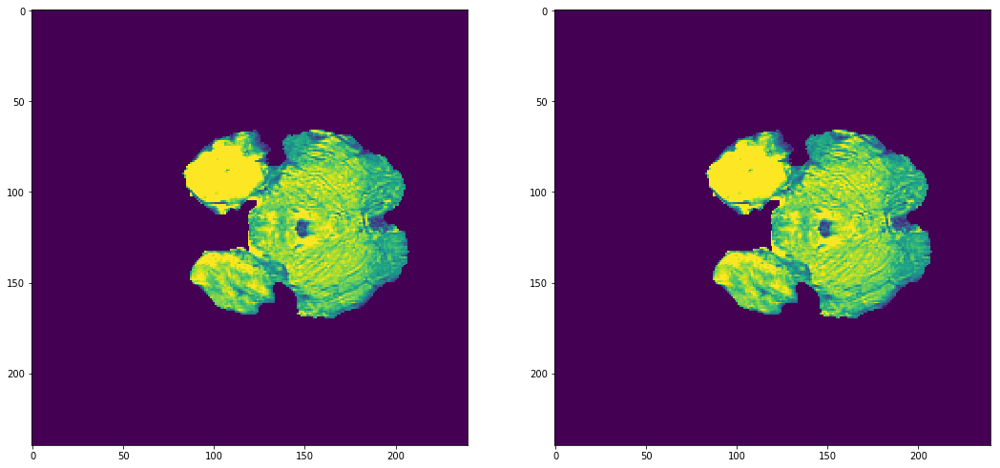

(0.0, 255.0, 32.9633674621582, 75.3557357788086)
(-0.43744054436683655, 2.9465384483337402, 2.7020773174513124e-08, 1.0)


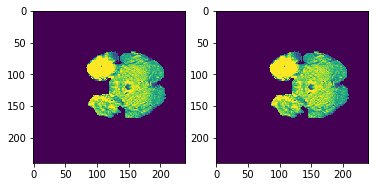

(0.0, 255.0, 34.249183654785156, 76.46643829345703)
(-0.4479021430015564, 2.886923313140869, -1.0463926614079355e-08, 1.0000001192092896)


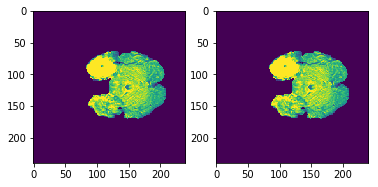

(0.0, 255.0, 35.33224105834961, 77.47950744628906)
(-0.4560244083404541, 2.8351969718933105, 7.576412741627792e-08, 1.0)


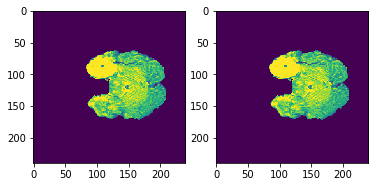

(0.0, 255.0, 36.40163040161133, 78.58307647705078)
(-0.4632287621498108, 2.7817726135253906, 4.437234579768301e-08, 0.9999999403953552)


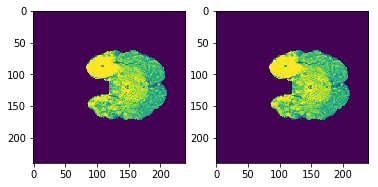

(0.0, 255.0, 37.3828125, 79.66374206542969)
(-0.46926164627075195, 2.7317206859588623, 1.0596381549987655e-08, 0.9999999403953552)


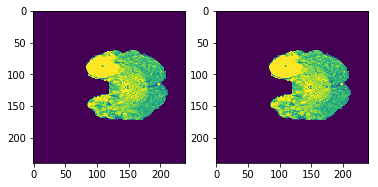

(0.0, 255.0, 37.932743072509766, 80.26184844970703)
(-0.4726164638996124, 2.704512119293213, -2.7020773174513124e-08, 0.9999999403953552)


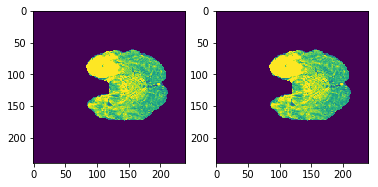

(0.0, 255.0, 38.51798629760742, 80.85712432861328)
(-0.47637510299682617, 2.677363157272339, -3.1789145538141383e-08, 0.9999999403953552)


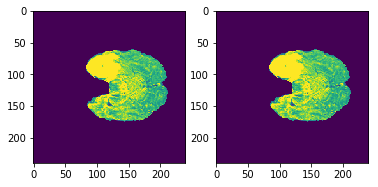

(0.0, 255.0, 38.89105987548828, 81.08743286132812)
(-0.4796229898929596, 2.6651580333709717, 1.655684656043377e-08, 1.0)


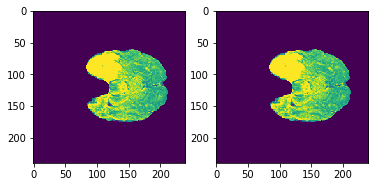

(0.0, 255.0, 38.98616409301758, 80.86302947998047)
(-0.48213011026382446, 2.6713778972625732, 4.649162121950212e-08, 1.0)


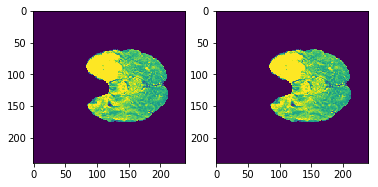

(0.0, 255.0, 39.33623123168945, 80.99883270263672)
(-0.4856436848640442, 2.6625771522521973, 6.8876477854473706e-09, 1.0)


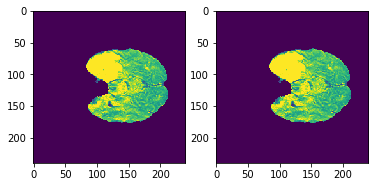

(0.0, 255.0, 40.075260162353516, 81.46997833251953)
(-0.49190643429756165, 2.638108015060425, -4.821353627448843e-08, 0.9999999403953552)


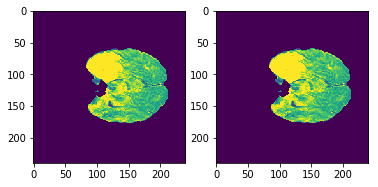

(0.0, 255.0, 40.848453521728516, 82.00174713134766)
(-0.49814558029174805, 2.6115713119506836, 2.119276309997531e-09, 1.0)


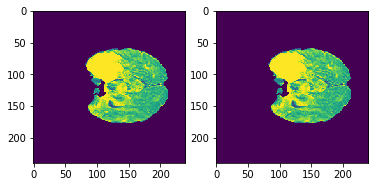

(0.0, 255.0, 41.80286407470703, 82.67742156982422)
(-0.5056183338165283, 2.578684091567993, 8.847978705261994e-08, 0.9999998807907104)


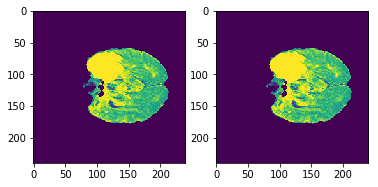

(0.0, 255.0, 43.29737854003906, 83.70252227783203)
(-0.5172813534736633, 2.5292482376098633, -3.761715205996552e-08, 1.0)


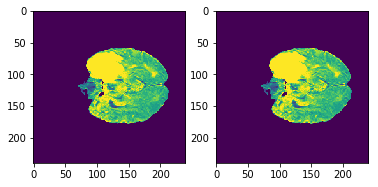

(0.0, 255.0, 44.45886993408203, 84.5311050415039)
(-0.5259514451026917, 2.490715742111206, 2.5166405848153772e-08, 0.9999999403953552)


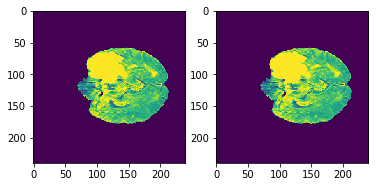

(0.0, 255.0, 45.538265228271484, 85.82615661621094)
(-0.5305919051170349, 2.440556049346924, -5.0597719791767304e-08, 1.0)


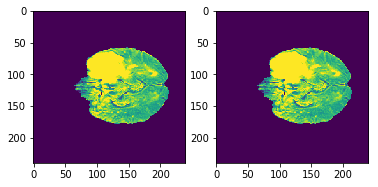

(0.0, 255.0, 46.623905181884766, 86.96080780029297)
(-0.5361531376838684, 2.3962278366088867, -1.4305114426349519e-08, 1.0000001192092896)


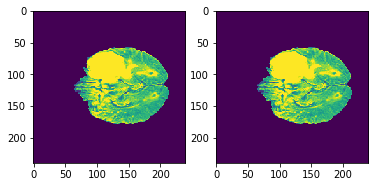

(0.0, 255.0, 47.48005294799805, 87.90007781982422)
(-0.5401641130447388, 2.36088228225708, -2.1457672971791908e-08, 0.9999999403953552)


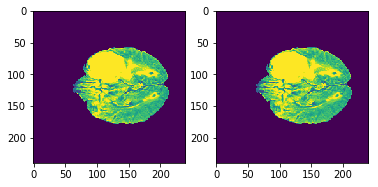

(0.0, 255.0, 48.121891021728516, 88.61975860595703)
(-0.5430200695991516, 2.3344669342041016, -4.185570645631742e-08, 1.0)


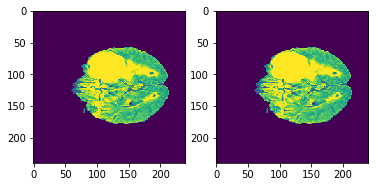

(0.0, 255.0, 48.54510498046875, 88.65021514892578)
(-0.5476075410842896, 2.3288910388946533, 5.0597719791767304e-08, 1.0000001192092896)


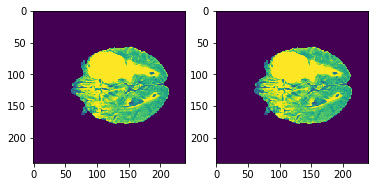

(0.0, 255.0, 48.85369873046875, 88.4914321899414)
(-0.5520774722099304, 2.329582452774048, 3.708733542495679e-09, 1.0)


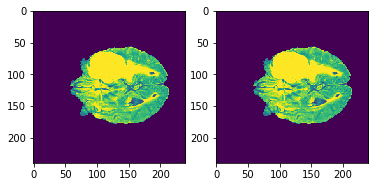

(0.0, 255.0, 49.07560729980469, 88.50465393066406)
(-0.5545023083686829, 2.3267271518707275, -4.185570645631742e-08, 1.0)


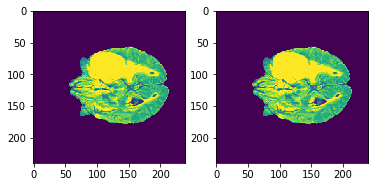

(0.0, 255.0, 49.446041107177734, 88.4498291015625)
(-0.5590340495109558, 2.3239810466766357, 3.549787663814641e-08, 0.9999999403953552)


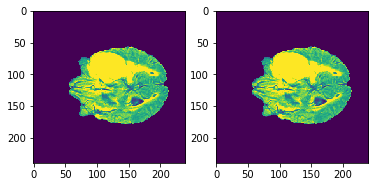

(0.0, 255.0, 49.776180267333984, 88.34552764892578)
(-0.5634310841560364, 2.322988271713257, -1.5894572324981482e-09, 1.0)


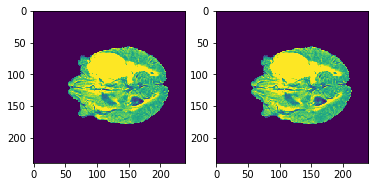

(0.0, 255.0, 50.31232452392578, 88.55609130859375)
(-0.5681456327438354, 2.3114101886749268, 8.742014223628303e-09, 1.0)


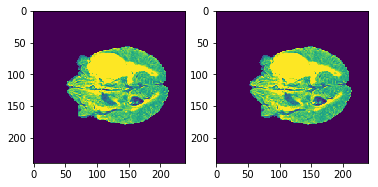

(0.0, 255.0, 50.90586853027344, 88.69187927246094)
(-0.5739681124687195, 2.3011791706085205, 3.761715205996552e-08, 1.0)


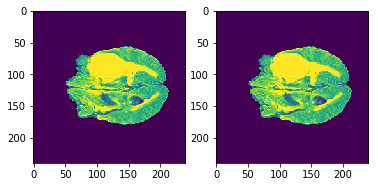

(0.0, 255.0, 51.31184005737305, 88.63272094726562)
(-0.5789316296577454, 2.2981345653533936, -6.728701862357411e-08, 1.0)


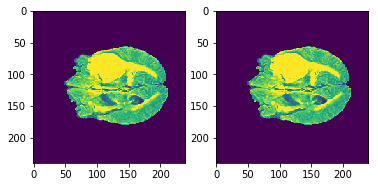

(0.0, 255.0, 51.7553825378418, 88.78515625)
(-0.5829333066940308, 2.2891929149627686, -5.907482503175743e-08, 0.9999998807907104)


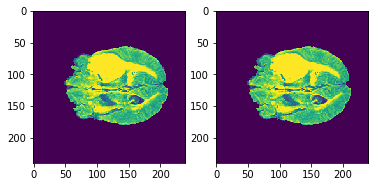

(0.0, 255.0, 52.32977294921875, 88.78250885009766)
(-0.58942049741745, 2.282792091369629, 5.880991693629767e-08, 1.0)


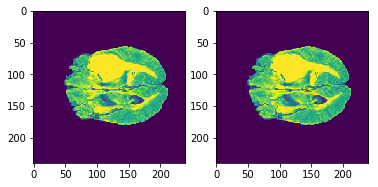

(0.0, 255.0, 52.49586868286133, 88.43250274658203)
(-0.5936315655708313, 2.2899487018585205, -4.185570645631742e-08, 1.0)


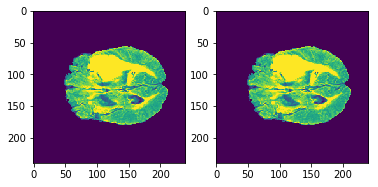

(0.0, 255.0, 52.64034652709961, 88.29022216796875)
(-0.5962246656417847, 2.2920026779174805, -4.635916894812908e-08, 1.0)


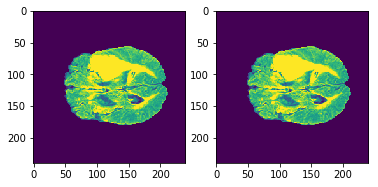

(0.0, 255.0, 52.85359191894531, 88.0466079711914)
(-0.6002961993217468, 2.295922040939331, 7.576412741627792e-08, 0.9999998807907104)


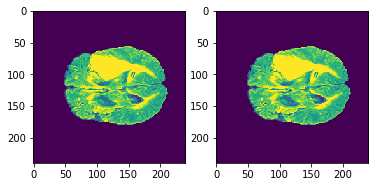

(0.0, 255.0, 52.801856994628906, 87.60389709472656)
(-0.6027393341064453, 2.308115243911743, -8.477105239990124e-09, 0.9999999403953552)


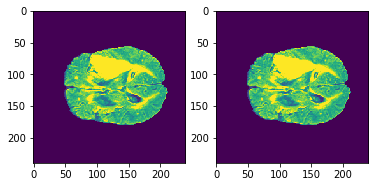

(0.0, 255.0, 52.75361251831055, 87.48725891113281)
(-0.6029914617538452, 2.31174373626709, -6.092919591083046e-08, 1.0)


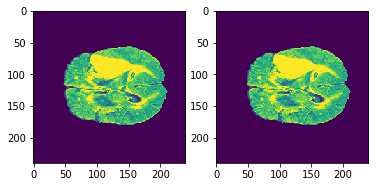

(0.0, 255.0, 52.80482482910156, 87.3477554321289)
(-0.6045407652854919, 2.314849615097046, 4.688898869176228e-08, 0.9999998807907104)


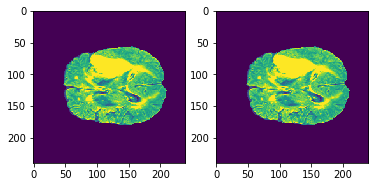

(0.0, 255.0, 52.58965301513672, 86.91891479492188)
(-0.6050479412078857, 2.3287463188171387, -9.695688873989639e-08, 1.0)


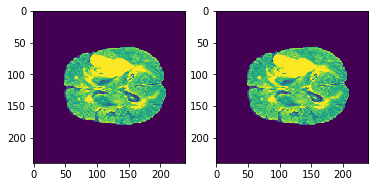

(0.0, 255.0, 52.18173599243164, 86.46415710449219)
(-0.6035123467445374, 2.345712184906006, -1.1126200405442432e-08, 0.9999999403953552)


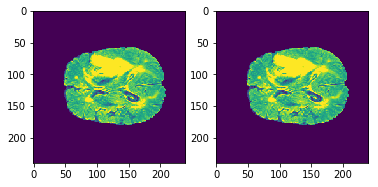

(0.0, 255.0, 51.77923583984375, 85.8370361328125)
(-0.6032323837280273, 2.3675389289855957, -4.238552619995062e-09, 0.9999999403953552)


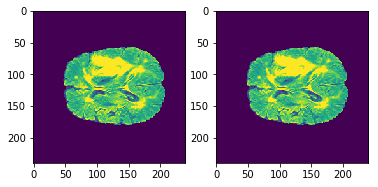

(0.0, 255.0, 51.2369270324707, 84.98036193847656)
(-0.6029319167137146, 2.397787570953369, 8.742014223628303e-09, 1.0)


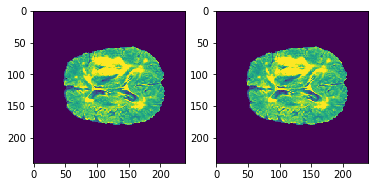

In [34]:
#Std vs non
for i in range(40,80):
    plt.subplot(1,2,1)
    plt.imshow(d['img'][0,:,:,i])
    
    plt.subplot(1,2,2)
    plt.imshow(standardizer(np.array(d['img'][0,:,:,i])))
    
    print(d['img'][0,:,:,i].min().item(),d['img'][0,:,:,i].max().item(),d['img'][0,:,:,i].mean().item(),d['img'][0,:,:,i].std().item())
    
    print(standardizer(np.array(d['img'][0,:,:,i])).min().item(),standardizer(np.array(d['img'][0,:,:,i])).max().item(),standardizer(np.array(d['img'][0,:,:,i])).mean().item(),standardizer(np.array(d['img'][0,:,:,i])).std().item())
    plt.show()


(-0.4119689528066051, 2.9636517572434027, 0.06562946290103584, 0.9898426891911731)
(-0.48250349959295213, 2.927785882300665, 1.9984014443252817e-17, 1.0)


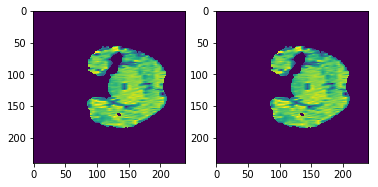

(-0.4119689528066051, 2.9636517572434027, 0.0896103244541042, 1.0116744301338536)
(-0.4957955013631334, 2.840900487136665, -2.3438041630975527e-17, 0.9999999999999999)


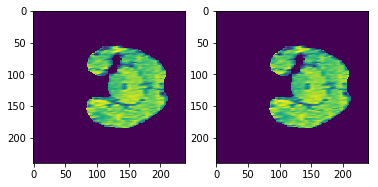

(-0.4119689528066051, 2.9636517572434027, 0.10366435328820371, 1.0244280428622792)
(-0.5033421192729336, 2.7918136861691494, 1.2335811384723961e-17, 0.9999999999999999)


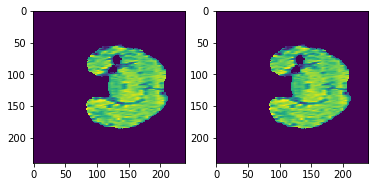

(-0.4119689528066051, 2.9636517572434027, 0.12562944028859235, 1.0394549446983332)
(-0.5171970777094232, 2.7303222399005, 1.3816108750890837e-16, 1.0)


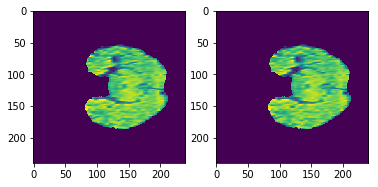

(-0.4119689528066051, 2.9636517572434027, 0.14007683818309002, 1.054757767044959)
(-0.5233908678985308, 2.677012218159482, 6.315935428978668e-17, 1.0)


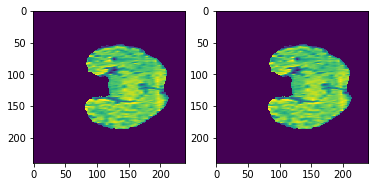

(-0.4119689528066051, 2.9636517572434027, 0.15064776781754735, 1.0615686330244303)
(-0.5299907957065195, 2.649878981603887, 8.585724723767877e-17, 1.0)


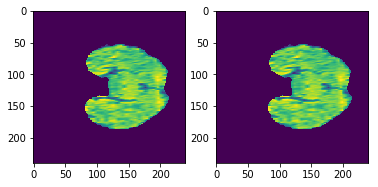

(-0.4119689528066051, 2.9636517572434027, 0.15553792851926102, 1.0646747779727441)
(-0.533037711991283, 2.637554925812662, -2.7632217501781673e-17, 1.0)


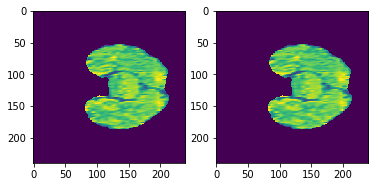

(-0.4119689528066051, 2.9636517572434027, 0.15936574396508804, 1.0662265095472985)
(-0.5358520457172402, 2.6301262735865887, 8.635067969306773e-17, 1.0)


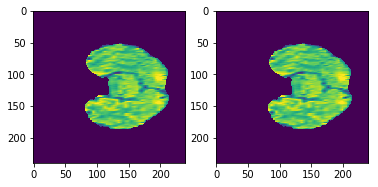

(-0.4119689528066051, 2.9636517572434027, 0.16186279436749587, 1.067495837384455)
(-0.5375540665560422, 2.624659681243208, 4.0461461341894596e-17, 1.0)


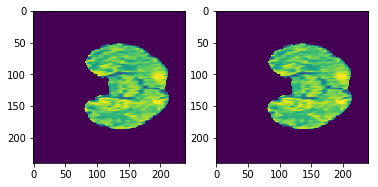

(-0.4119689528066051, 2.9636517572434027, 0.16653125304079036, 1.0731302143091674)
(-0.5390820423304453, 2.6065287770132817, 4.934324553889585e-19, 1.0)


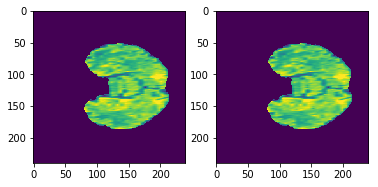

(-0.4119689528066051, 2.9636517572434027, 0.16994994254887985, 1.0783437325533785)
(-0.5396460601879237, 2.5907565292551857, 1.0954200509634878e-16, 0.9999999999999999)


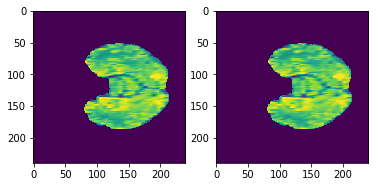

(-0.4119689528066051, 2.9636517572434027, 0.17607992070379913, 1.0857007389471363)
(-0.5416354222418114, 2.567554699492564, -3.503370433261605e-17, 1.0000000000000002)


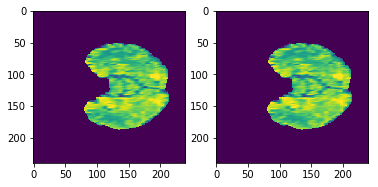

(-0.4119689528066051, 2.9636517572434027, 0.17781732375695214, 1.086041253984231)
(-0.5430653708034935, 2.5651499021525, 1.2533184366879544e-16, 1.0)


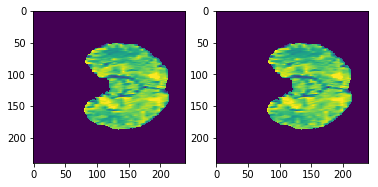

(-0.4119689528066051, 2.9636517572434027, 0.1806787173931007, 1.0881320219959818)
(-0.5446515705797108, 2.5575914885890523, 1.376676550535194e-16, 1.0)


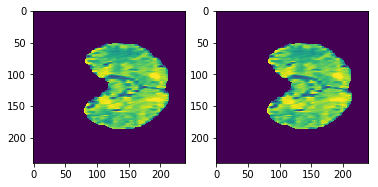

(-0.4119689528066051, 2.9636517572434027, 0.18500715923976327, 1.0935315186393566)
(-0.5459205189997411, 2.5410046908871884, -8.585724723767877e-17, 0.9999999999999999)


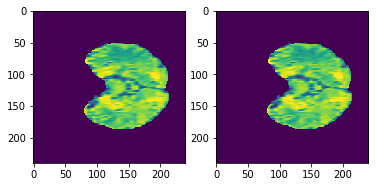

(-0.4119689528066051, 2.9636517572434027, 0.19497905109921504, 1.105034824166204)
(-0.5492616697199117, 2.5055289476168188, -1.139828971948494e-16, 1.0)


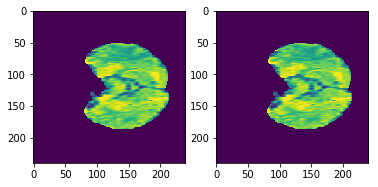

(-0.4119689528066051, 2.9636517572434027, 0.19547801888138827, 1.1069009836264536)
(-0.5487864350288075, 2.5008540139630893, -8.388351741612294e-18, 1.0)


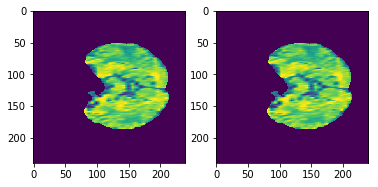

(-0.4119689528066051, 2.9636517572434027, 0.19772600004740262, 1.0977702249696972)
(-0.5553987815898116, 2.5196072040997146, -1.258252761241844e-16, 1.0)


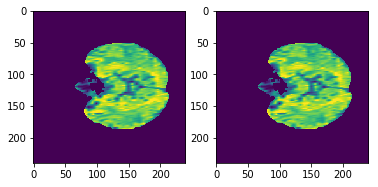

(-0.4119689528066051, 2.9636517572434027, 0.20202182239365965, 1.0908560488101386)
(-0.562857130159649, 2.5316391751737215, -7.796232795145543e-17, 0.9999999999999997)


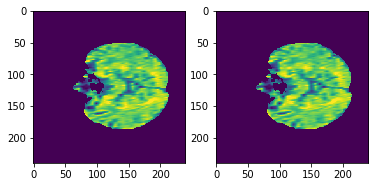

(-0.4119689528066051, 2.9636517572434027, 0.22622466241174066, 1.1004123692284327)
(-0.5799636327364652, 2.487659112237978, -1.578983857244667e-17, 0.9999999999999999)


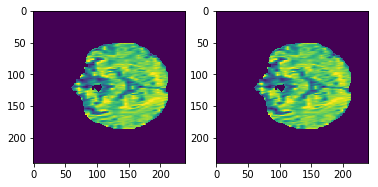

(-0.4119689528066051, 2.9636517572434027, 0.24574494549782802, 1.1233708334379329)
(-0.5854875239086468, 2.4194418477794573, -4.7369515717340015e-17, 1.0)


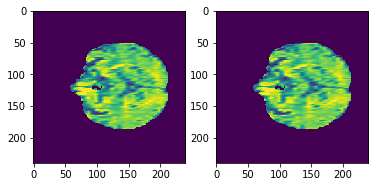

(-0.4119689528066051, 2.9636517572434027, 0.2661415321127157, 1.139998537411089)
(-0.5948396854183754, 2.3662606159545994, 6.069219201284189e-17, 1.0000000000000002)


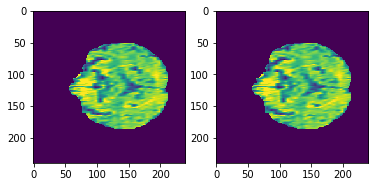

(-0.4119689528066051, 2.9636517572434027, 0.27739249540049543, 1.1523622177402233)
(-0.5982211336959302, 2.331109558275032, 6.019875955745294e-17, 1.0)


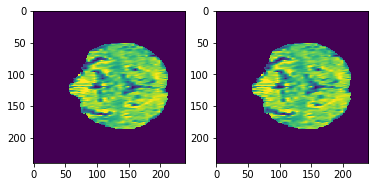

(-0.4119689528066051, 2.9636517572434027, 0.2873209867381676, 1.1589106275171832)
(-0.6034080568808664, 2.3093704892329128, 1.4161511469663108e-16, 1.0)


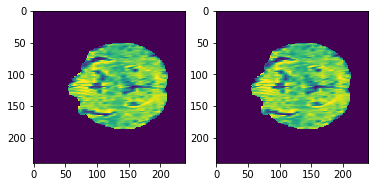

(-0.4119689528066051, 2.9636517572434027, 0.29709467366693365, 1.1681546570951578)
(-0.6069999184718415, 2.2827287593110763, 4.934324553889585e-18, 0.9999999999999999)


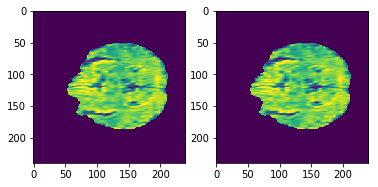

(-0.4119689528066051, 2.9636517572434027, 0.3126870713142185, 1.1804062715525032)
(-0.6139092379324734, 2.245826510723224, -5.575786745895231e-17, 0.9999999999999999)


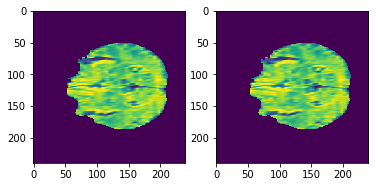

(-0.4119689528066051, 2.9636517572434027, 0.31852927913050305, 1.1857936904510806)
(-0.6160469388837442, 2.2306961664973297, 1.1348946473946044e-16, 1.0)


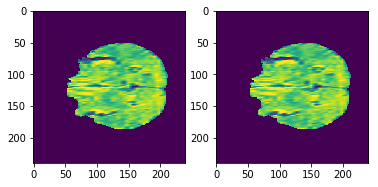

(-0.4119689528066051, 2.9636517572434027, 0.33278759449703205, 1.1904591323808782)
(-0.6256098945611425, 2.2099767466570235, -7.154770603139898e-17, 1.0000000000000002)


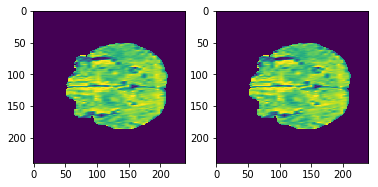

(-0.4119689528066051, 2.9636517572434027, 0.336412505592651, 1.190523439685202)
(-0.628620932527067, 2.206812541665718, -4.934324553889585e-19, 1.0)


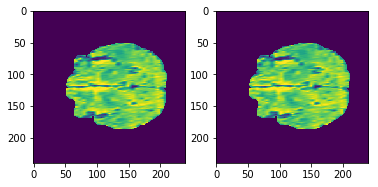

(-0.4119689528066051, 2.9636517572434027, 0.34529855509839563, 1.1937047096967168)
(-0.6343897911616938, 2.1934871412782813, 4.934324553889585e-18, 1.0)


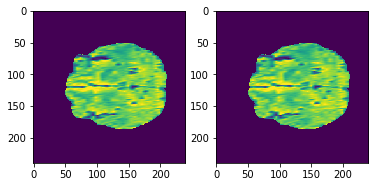

(-0.4119689528066051, 2.9636517572434027, 0.34718108728486835, 1.193365858800646)
(-0.6361474349403012, 2.1925324605018046, 1.8257000849391464e-17, 1.0)


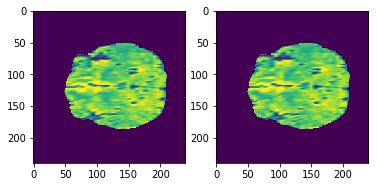

(-0.4119689528066051, 2.9636517572434027, 0.34881897321802524, 1.1906768509841936)
(-0.6389597056019519, 2.196108440640827, 1.5296406117057712e-17, 0.9999999999999999)


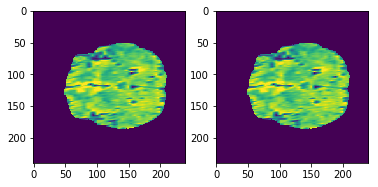

(-0.4119689528066051, 2.9636517572434027, 0.34594513994187864, 1.1856971772598321)
(-0.6392194284381034, 2.2077553956851212, 4.7369515717340015e-17, 0.9999999999999999)


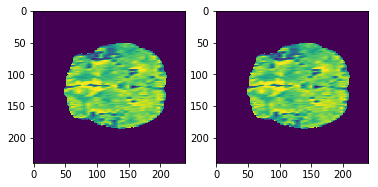

(-0.4119689528066051, 2.9636517572434027, 0.35112859971112, 1.1889287007036982)
(-0.6418418331251304, 2.1973948769473512, 6.562651656673148e-17, 0.9999999999999999)


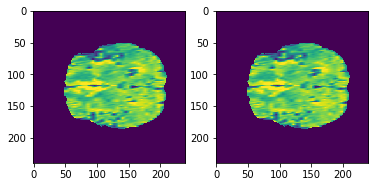

(-0.4119689528066051, 2.9636517572434027, 0.3515808497341836, 1.189068383414767)
(-0.642146777522306, 2.196756400612575, -1.569115208136888e-16, 1.0)


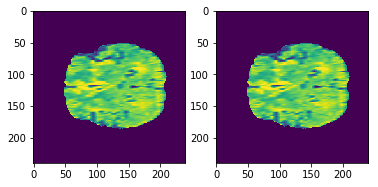

(-0.4119689528066051, 2.9636517572434027, 0.3531297231322482, 1.1883870778266703)
(-0.6438182741818932, 2.1967124549705983, 1.4112168224124212e-16, 1.0)


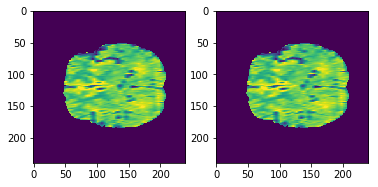

(-0.4119689528066051, 2.9636517572434027, 0.3601324111421865, 1.1951739143615276)
(-0.6460215178948924, 2.178379158969738, 2.4178190314058963e-17, 0.9999999999999999)


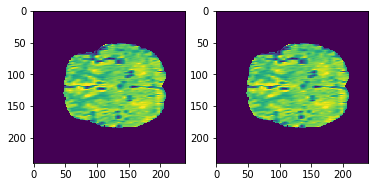

(-0.4119689528066051, 2.9636517572434027, 0.36442298119596345, 1.1962495267017084)
(-0.6490273611588454, 2.1728337450267134, 2.319132540328105e-17, 1.0)


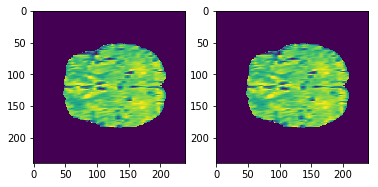

(-0.4119689528066051, 2.9636517572434027, 0.36161217542914653, 1.193031554440864)
(-0.6484219470615277, 2.1810505845976595, 1.6283271027835628e-16, 1.0)


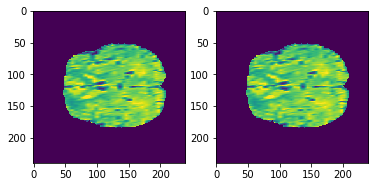

(-0.4119689528066051, 2.9636517572434027, 0.3555261506688854, 1.1868229780010586)
(-0.6466859675557624, 2.197588263114697, 1.5493779099213297e-16, 1.0)


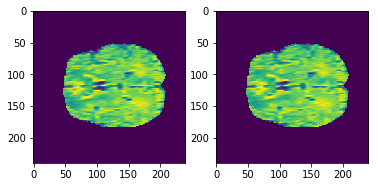

In [142]:
#Std vs non
for i in range(40,80):
    plt.subplot(1,2,1)
    plt.imshow(d['img'][0,:,:,i])
    
    plt.subplot(1,2,2)
    plt.imshow(standardizer(np.array(d['img'][0,:,:,i])))
    
    print(d['img'][0,:,:,i].min().item(),d['img'][0,:,:,i].max().item(),d['img'][0,:,:,i].mean().item(),d['img'][0,:,:,i].std().item())
    
    print(standardizer(np.array(d['img'][0,:,:,i])).min().item(),standardizer(np.array(d['img'][0,:,:,i])).max().item(),standardizer(np.array(d['img'][0,:,:,i])).mean().item(),standardizer(np.array(d['img'][0,:,:,i])).std().item())
    plt.show()



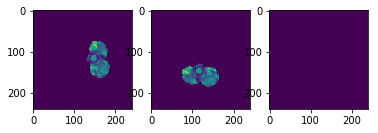

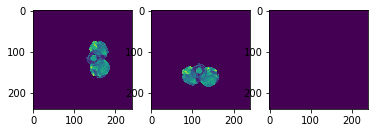

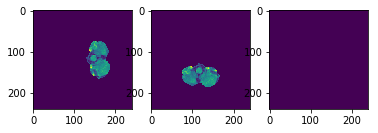

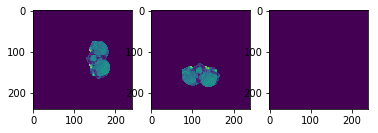

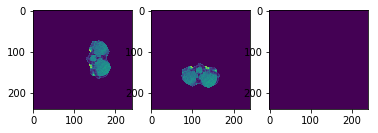

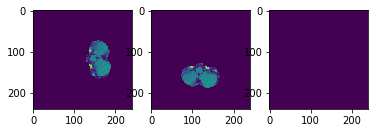

KeyboardInterrupt: 

In [6]:
d=next(dsi)  #Transpose - rotates image
for i in range(0,80):
#     print(np.shape(d['img']))
    plt.subplot(1,3,1)
    plt.imshow(d['img'][0,:,:,i])
    tr=np.array(d['img']).T
    
#     print(np.shape(tr))
    plt.subplot(1,3,2)
    plt.imshow(tr[i,:,:,0])
    
    plt.subplot(1,3,3)
#     print(np.shape(d['mask']))
    plt.imshow(d['seg_orig'][:,:,i])
#     tr=np.array(d['img']).T
    
    plt.show()


    
    

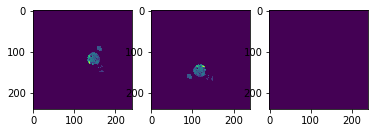

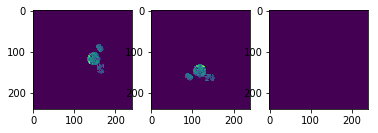

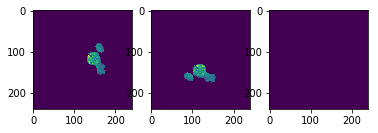

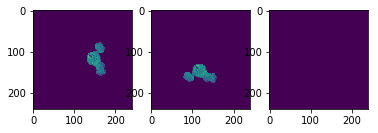

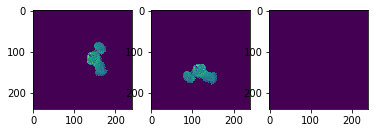

...

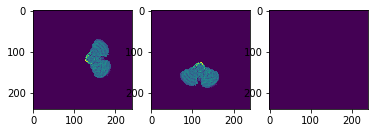

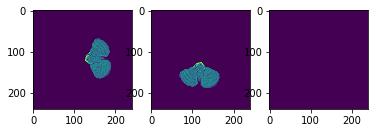

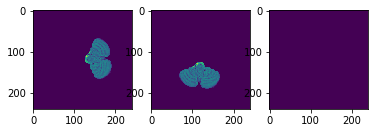

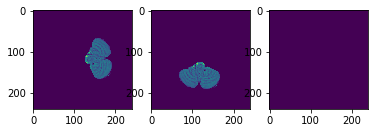

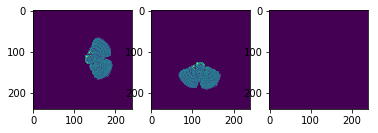

KeyboardInterrupt: 

In [153]:
d=next(dsi)  #Transpose - rotates image
for i in range(0,80):
#     print(np.shape(d['img']))
    plt.subplot(1,3,1)
    plt.imshow(d['img'][0,:,:,i])
    tr=np.array(d['img']).T
    
#     print(np.shape(tr))
    plt.subplot(1,3,2)
    plt.imshow(tr[i,:,:,0])
    
    plt.subplot(1,3,3)
#     print(np.shape(d['mask']))
    plt.imshow(d['seg_orig'][:,:,i])
#     tr=np.array(d['img']).T
    
    plt.show()


    
    

In [279]:
for i in range(0,50):
    it=iter(ds)
    d=next(it)
    print(np.unique(d['seg_orig']))
    
def calc(iflat,tflat,loss_weights):
    smooth = 1.

    intersection = (iflat * loss_weights*tflat).sum() 
    
    return 1-(((2. * intersection + smooth) /
              (iflat.sum() + loss_weights*tflat.sum() + smooth)))


loss_weights=3*torch.tensor([0.00233549, 0.14019698, 0.04583725, 0.14620756],requires_grad=False).cuda()

def dice_loss(inpu, target):  # [bs,4,96,96,64]
    a=b=c=d=0
    
    for k in range(inpu.size()[0]):

        ip=inpu[k,0,:,:,:].view(-1)
        tar=target[k,0,:,:,:].view(-1)
        a+=calc(ip,tar)
        print(a)
        
        ip=inpu[k,1,:,:,:].view(-1)
        tar=target[k,1,:,:,:].view(-1)
        b+=calc(ip,tar)
        
        ip=inpu[k,2,:,:,:].view(-1)
        tar=target[k,2,:,:,:].view(-1)
        c+=calc(ip,tar)
        
        ip=inpu[k,3,:,:,:].view(-1)
        tar=target[k,3,:,:,:].view(-1)
        d+=calc(ip,tar)

    raw_scores=(loss_weights[0]*a + loss_weights[1]*b + loss_weights[2]*c + loss_weights[3]*d)/(4*inpu.size()[0])
    
    return 1.0 - raw_scores

[0 1 2 4]
[0 1 2 4]
[0 1 2 4]


KeyboardInterrupt: 

In [91]:
k['img'].size()

torch.Size([4, 240, 240, 155])

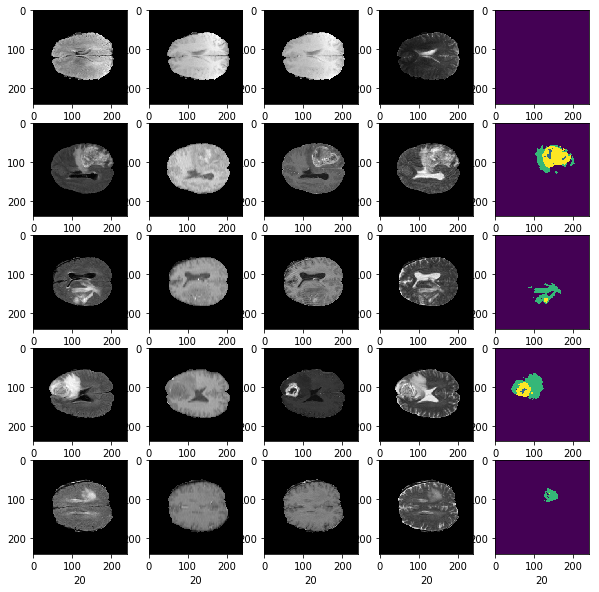

In [10]:
# visulaise slice'th slice of different patients

slice=90
rows=5

fig = plt.figure(figsize=(10,10))
cols=5   # if cols=4 uncomment last plot

end=(rows-1)*cols+1

for i in range(0,end,cols):
    im=next(dsi)
    image = im['img']
    
    plt.subplot(rows,cols,i+1)
    f=image[0,:,:,slice]
    plt.imshow(f,cmap='gray')
    xlab=str(i)
    plt.xlabel(xlab)
    
    plt.subplot(rows,cols,i+2)
    t1=image[1,:,:,slice]
    plt.imshow(t1,cmap='gray')
    xlab=str(i)
    plt.xlabel(xlab)
    
    plt.subplot(rows,cols,i+3)
    t1ce=image[2,:,:,slice]
    plt.imshow(t1ce,cmap='gray')
    xlab=str(i)
    plt.xlabel(xlab)
    
    
    plt.subplot(rows,cols,i+4)
    t2=image[3,:,:,slice]
    plt.imshow(t2,cmap='gray')
    xlab=str(i)
    plt.xlabel(xlab)
    
    image = im['seg_orig']
    plt.subplot(rows,cols,i+5)
    seg=image[:,:,slice]
    plt.imshow(seg)
    xlab=str(i)
    plt.xlabel(xlab)

plt.show()

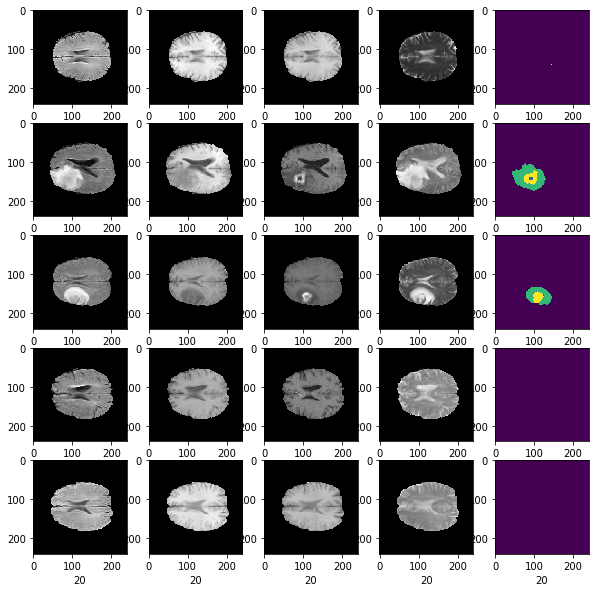

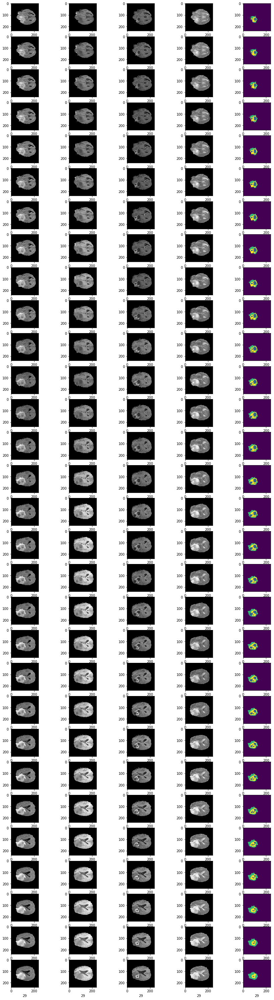

In [17]:

def single_patient(patient=None,rows=30,base=15):
    # to see across modalities of single patient
    # each col is a modality
    
    fig = plt.figure(figsize=(15,54))
    if patient==None:
        im=next(dsi)
        image = im['img']
        mask=im['seg_orig']
        
        for i in range(5):
            
            if i<4:im1=image[i]; im1=np.swapaxes(im1,1,2); im1=np.swapaxes(im1,0,1)
            else:im1=mask; im1=np.swapaxes(im1,1,2); im1=np.swapaxes(im1,0,1)
            
            for j in range(rows):
                
                plt.subplot(rows,5,i+5*j+1)
                
                single=im1[base+j]
                
                if i<4:plt.imshow(single,cmap='gray')
                else: plt.imshow(single)
                xlab=str(j)
                plt.xlabel(xlab)
        plt.show()

single_patient(base=60)

In [9]:

def single_patient_two(slice=30,patient=None,rows=1,cols=5,base=15):
    # to see across modalities of single patient
    # each col is a modality
    
    
         
        
        
    for i in range(0,30):
        fig = plt.figure(figsize=(15,15))

        plt.subplot(rows,cols,1)
        f=image[0,:,:,slice+i]
        plt.imshow(f,cmap='gray')
        xlab=str(i)
        plt.xlabel(xlab)

        plt.subplot(rows,cols,2)
        t1=image[1,:,:,slice+i]
        plt.imshow(t1,cmap='gray')
        xlab=str(i)
        plt.xlabel(xlab)

        plt.subplot(rows,cols,3)
        t1ce=image[2,:,:,slice+i]
        plt.imshow(t1ce,cmap='gray')
        xlab=str(i)
        plt.xlabel(xlab)


        plt.subplot(rows,cols,4)
        t2=image[3,:,:,slice+i]
        plt.imshow(t2,cmap='gray')
        xlab=str(i)
        plt.xlabel(xlab)

        seg = im['seg_orig']
        plt.subplot(rows,cols,5)
        seg=seg[:,:,slice+i]
        plt.imshow(seg)
        xlab=str(i)
        plt.xlabel(xlab)
        plt.show()

single_patient_two(slice=60)

NameError: global name 'image' is not defined

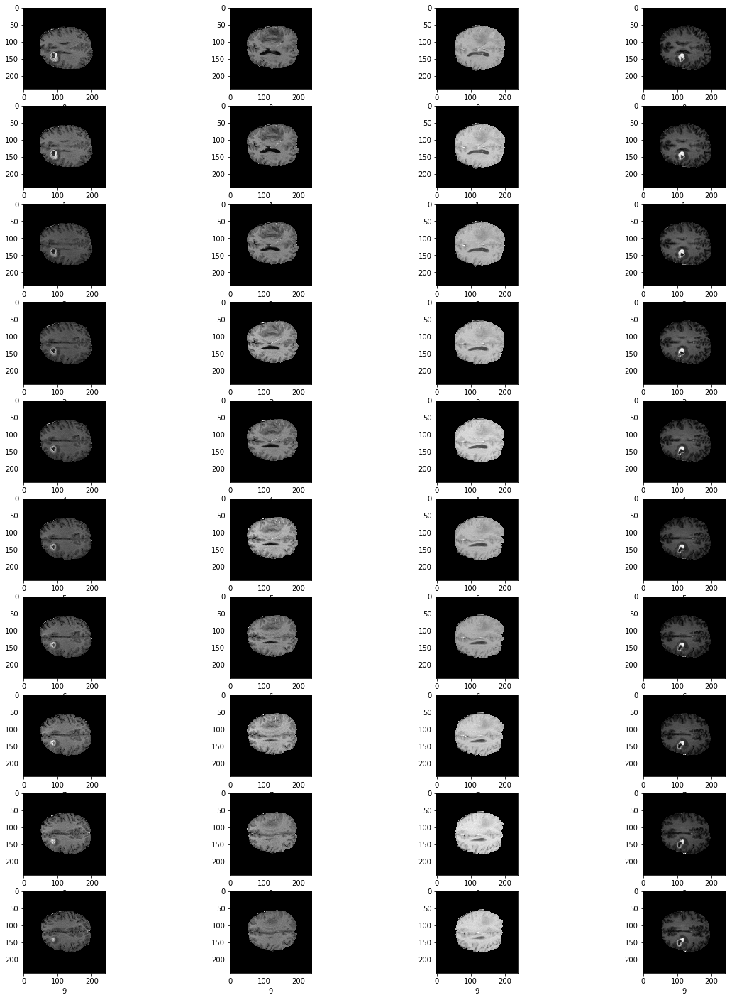

In [119]:

def multi_patient(patient=None,rows=10,no=4,base=80,mode=0): 
    # To compare same modality of no patients 
    # no is number of patients to see side by side
    # mode is numeric of modality, mode 4 is seg map
    # each col is a patient
    
    
    fig = plt.figure(figsize=(20,25))
    
    for i in range(no):
    
        im=next(dsi)
        if mode<4: image = im['img'][mode]
        else: image=im['seg_orig']
        
        for j in range(rows):
            
            plt.subplot(rows,no,j*no+i+1)
            single=image[:,:,base+j]
            if mode<4:plt.imshow(single,cmap='gray')
            else: plt.imshow(single)
            xlab=str(j)
            plt.xlabel(xlab)
    plt.show()


multi_patient(base=90,mode=2)

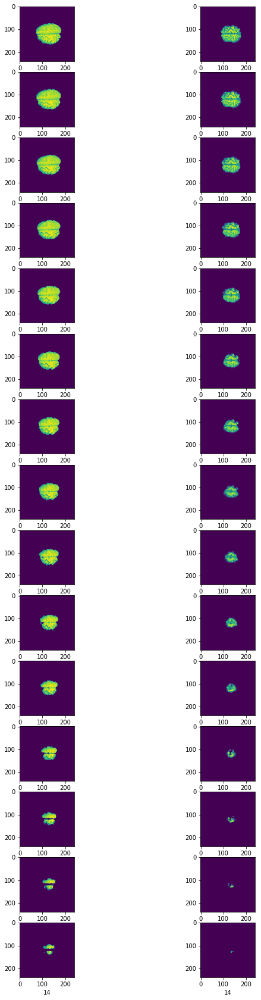

In [332]:

def HGG_v_LGG(patient=None,rows=15,no=2,base=80,mode=0): 
    
    idx = np.random.randint(0,75)
    hgg=glob.glob('/Users/admin/Downloads/MICCAI_BraTS_2018_Data_Training/HGG/*')
    lgg=glob.glob('/Users/admin/Downloads/MICCAI_BraTS_2018_Data_Training/LGG/*')
    
    path=[hgg,lgg]
    
    fig = plt.figure(figsize=(10,30))
    for paths in path:
        
        name=paths[idx].split('/')[-1]
        flair=paths[idx]+'/'+name+'_flair.nii'  # image files location
        t1=paths[idx]+'/'+name+'_t1.nii'
        t1ce=paths[idx]+'/'+name+'_t1ce.nii'
        t2=paths[idx]+'/'+name+'_t2.nii'        
        seg=paths[idx]+'/'+name+'_seg.nii'
        zipper(flair,t1,t1ce,t2,seg)
        
 
        img,seg,seg_orig=read_img(flair=flair,t1=t1,t1ce=t1ce,t2=t2,seg=seg,mode='val')

        if mode<4: image = img[mode]
        else: image=seg_orig
            
        
        for i in range(rows):
            if paths==hgg: c=2*i+1
            else: c=2*i+2
            
            plt.subplot(rows,no,c)
            
            single=image[:,:,base+i]
            if mode<4:plt.imshow(single)
            else: plt.imshow(single)
            xlab=str(i)
            plt.xlabel(xlab)
    plt.show()
            
        
HGG_v_LGG(base=-30,mode=1)          
        
        
    
    
    
    

In [96]:
from skimage import exposure

def noisy_v_he_std(patient=None,rows=5,base=80,mode=0): 
    
    # takes one patient
    # plot original img, noisy, HE, standarised, standarised+noise,standarised+he
    fig = plt.figure(figsize=(10,10))
     
    im=next(dsi)
    if mode<4: image = im['img'][mode]
    else: image=im['seg_orig']

    noise=noisy(np.array(image))
    img_eq = exposure.equalize_hist(np.array(image))
    std=standardizer(np.array(image))
    
    n_s=standardizer(noise)
    n_he=standardizer(img_eq)
    
    l=[image,noise,img_eq,std,n_s,n_he]
    
    for j in range(0,6):
        for i in range(rows):
            if j==0: c=6*i+1
            elif j==1:c=6*i+2
            elif j==2: c=6*i+3
            elif j==3: c=6*i+4
            elif j==4: c=6*i+5
            else: c=6*i+6
                
            plt.subplot(rows,6,c)
            single=l[j][:,:,base+i]
            plt.imshow(single)
            print(i)
            print(np.shape(single))
            m=round(np.mean(single),2)
            std=round(np.std(single),2)
            xlab=str(std)+'|'+str(m)
            plt.xlabel(xlab)

    plt.show()
    
noisy_v_he_std()    
    

NameError: global name 'noisy' is not defined

In [204]:
im['img']
standarise
# exposure.equalize_hist(np.array(image))

tensor([107, 107, 132,  ..., 284, 299,  76], dtype=torch.int16)

In [247]:
from skimage import exposure

def noisy_v_he_std(patient=None,rows=5,base=80,mode=0): 
    
    # takes one patient
    # plot original img, noisy, HE, standarised, standarised+noise,standarised+he
    fig = plt.figure(figsize=(10,10))
     
    im=next(dsi)
    if mode<4: image = im['img'][mode]
    else: image=im['seg_orig']

    noise=noisy(np.array(image))
    img_eq = exposure.equalize_hist(np.array(image))
    std=standardizer(np.array(image))
    
    n_s=standardizer(noise)
    n_he=standardizer(img_eq)
    
    l=[image,noise,img_eq,std,n_s,n_he]
    
    for j in range(0,6):
        for i in range(rows):
            if j==0: c=6*i+1
            elif j==1:c=6*i+2
            elif j==2: c=6*i+3
            elif j==3: c=6*i+4
            elif j==4: c=6*i+5
            else: c=6*i+6
                
            plt.subplot(rows,6,c)
            single=l[j][:,:,base+i]
            plt.imshow(single)
            
            m=round(np.mean(single),2)
            std=round(np.std(single),2)
            xlab=str(std)+'|'+str(m)
            plt.xlabel(xlab)

    plt.show()

     
    
noisy_v_he_std()    
    

(torch.Size([1, 1, 240, 240]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1, 1, 240, 155]), 1)
(torch.Size([1

RuntimeError: Invalid index in scatter at /Users/soumith/code/builder/wheel/pytorch-src/torch/lib/TH/generic/THTensorMath.c:639

(240, 240, 155)


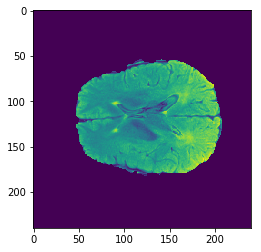

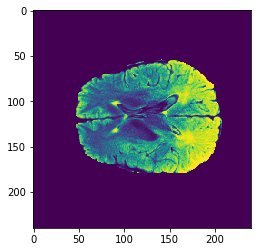

In [246]:

def noisy(self,image): # only for inputs
    choice=1# add noise to 20% of the images
    if choice==1:
        row,col,ch= image.shape
        mean = 0
        var = 0.3
        sigma = var#**0.5
        gauss = np.random.normal(mean,sigma,(row,col,ch))
        gauss = gauss.reshape(row,col,ch)
        noisy = image + gauss
        noisy = nd.gaussian_filter(noisy, sigma=3, order=0)
        
        return noisy
    else:
        return image
from skimage import exposure

image = np.array(im['img'][0])
print(np.shape(image))
img_eq = exposure.equalize_hist(image)

plt.imshow(image[:,:,80])
plt.show()
plt.imshow(img_eq[:,:,80])
plt.show()

In [146]:
p='/Users/admin/Downloads/MICCAI_BraTS_2018_Data_Training/HGG/Brats18_CBICA_ATX_1'
p.split('/')[-1]

'Brats18_CBICA_ATX_1'

In [222]:
img = nib.load('/Users/admin/Downloads/MICCAI_BraTS17_Data_Training/HGG/Brats17_2013_2_1/Brats17_2013_2_1_seg.nii')

a = np.array(img.dataobj)

np.unique(a)

array([   0,    1,    2, ..., 1233, 1245, 1252], dtype=int16)

(240, 240, 155)


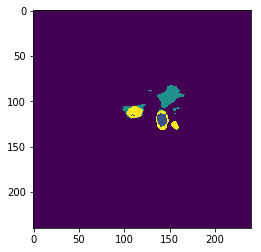

In [337]:
img = nib.load('/Users/admin/Downloads/MICCAI_BraTS17_Data_Training/HGG/Brats17_2013_2_1/Brats17_2013_2_1_seg.nii')

a = np.array(img.dataobj)

print(np.shape(a))
plt.imshow(a[:,:,90])
plt.show()

In [264]:
def one_hot(a):
    g1=a[:,:,:]==0
    g2=a[:,:,:]==1
    g3=a[:,:,:]==2
    g4=a[:,:,:]==4
    return torch.stack((g1,g2,g3,g4),0)


In [265]:
one_ho=one_hot(a)

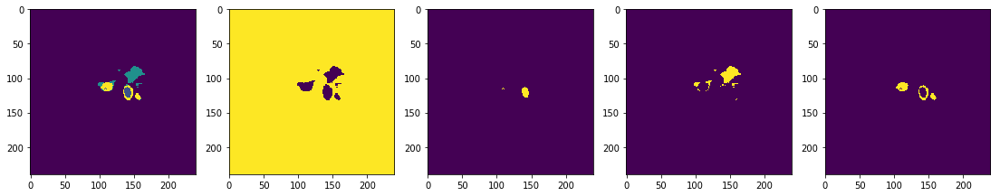

In [263]:
fig=plt.figure(figsize=(19,19))

plt.subplot(1,5,1)
plt.imshow(a[:,:,90])

plt.subplot(1,5,2)
plt.imshow(one_hot[0,:,:,90])

plt.subplot(1,5,3)
plt.imshow(one_hot[1,:,:,90])

plt.subplot(1,5,4)
plt.imshow(one_hot[2,:,:,90])

plt.subplot(1,5,5)
plt.imshow(one_hot[3,:,:,90])
 
plt.show()

In [324]:
def inter(img,zoom=0.5): return nd.interpolation.zoom(img, zoom=zoom) 

def zoom(base=0,mode=0,rows=15):
    fig=plt.figure(figsize=(9,45))
    im=next(dsi)
    image = im['img'] 
    mask=im['seg_orig']
    l=[x for x in image]
    l.append(mask)
    
    image=l[mode]
    
    zoomed=inter(image)
    
    l=[image,zoomed]
    print(np.shape(image),np.shape(zoomed))
    for j in range(0,2):
        for i in range(rows):
            if j==0: s=2*i+1
            else: s=2*i+2
                
            plt.subplot(rows,2,s)
            plt.imshow(l[j][:,:,base+i])
    plt.show()
        
    

(torch.Size([240, 240, 155]), (120, 120, 78))


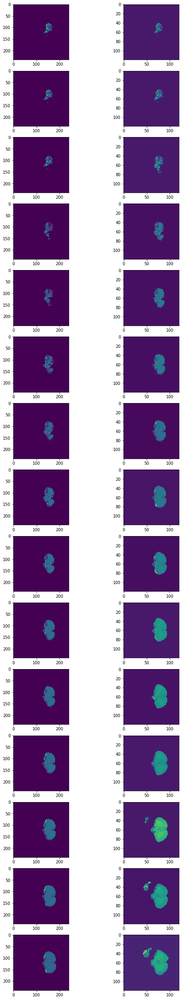

In [330]:
zoom(mode=2,base=0)

In [345]:
dims=torch.from_numpy(a)
dims.unsqueeze_(0)
print(dims.size())

dims=torch.cat((dims,dims),0)
print(dims.size())
non_zero = (dims!=0).nonzero()  
print(non_zero.size())

h_min = non_zero[:, 1].min()
h_max = non_zero[:, 1].max()
w_min = non_zero[:, 2].min()
w_max = non_zero[:, 2].max()

d_min = non_zero[:, 3].min()
d_max = non_zero[:, 3].max()

print(h_min,h_max,w_min,w_max,d_min,d_max)

torch.Size([1, 240, 240, 155])
torch.Size([2, 240, 240, 155])
torch.Size([122170, 4])
(80, 142, 80, 175, 69, 126)


0


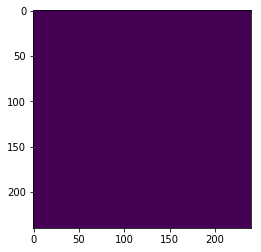

1


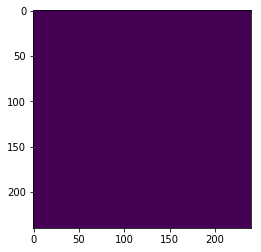

2


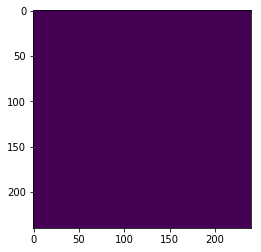

3


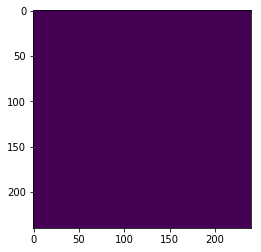

4


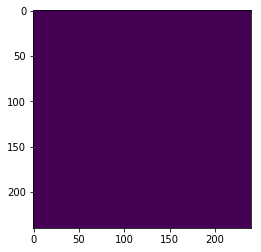

5


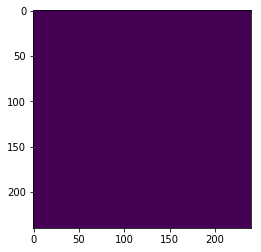

6


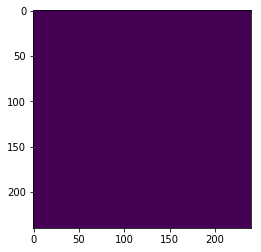

7


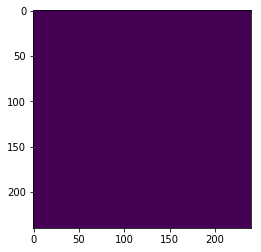

8


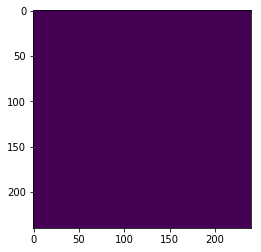

9


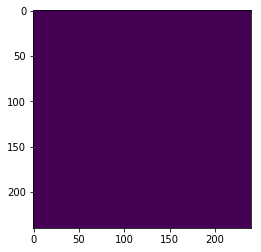

10


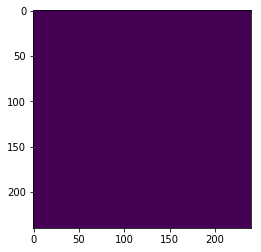

11


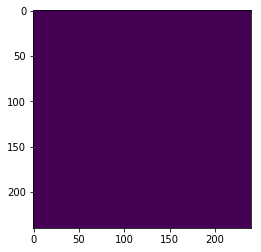

12


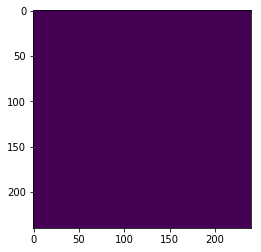

13


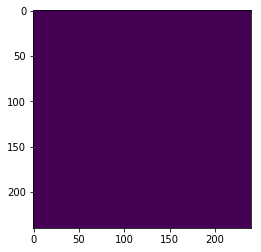

14


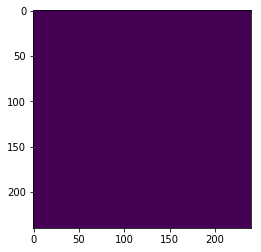

15


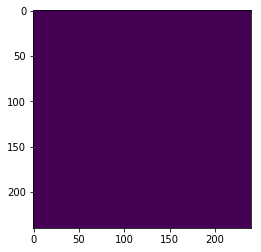

16


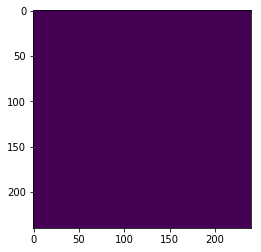

17


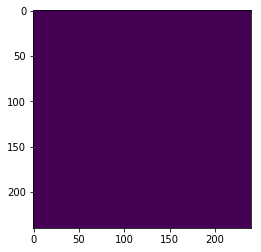

18


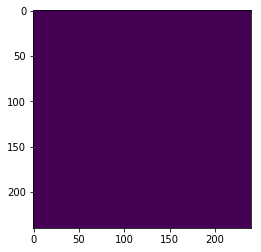

19


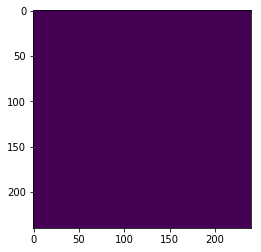

20


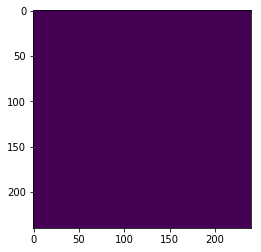

21


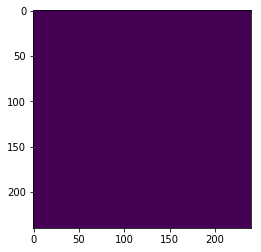

22


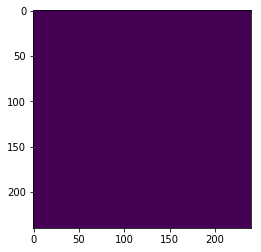

23


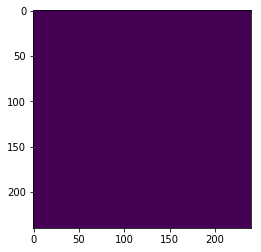

24


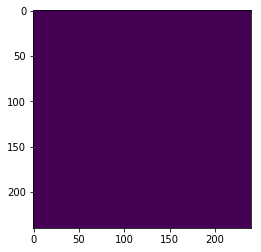

25


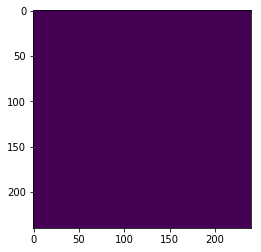

26


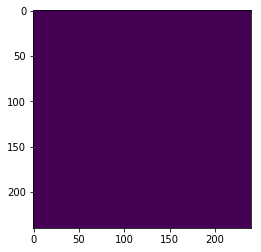

27


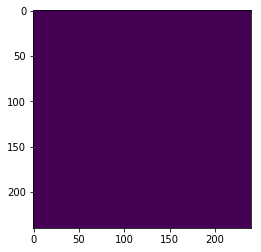

28


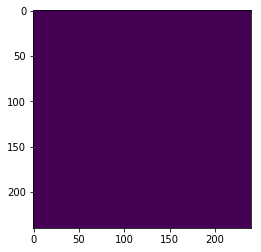

29


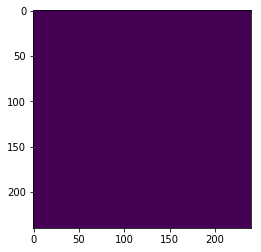

30


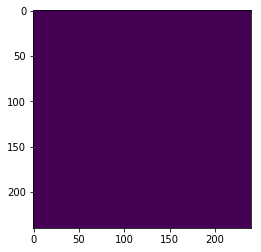

31


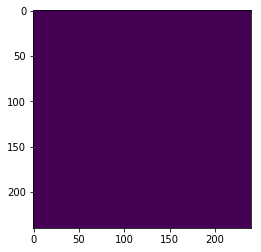

32


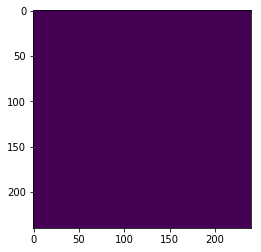

33


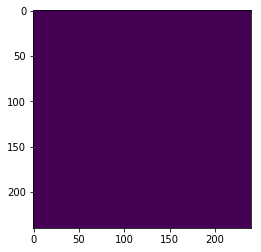

34


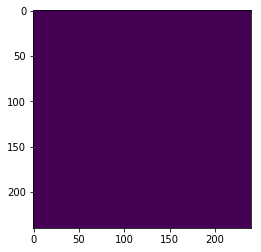

35


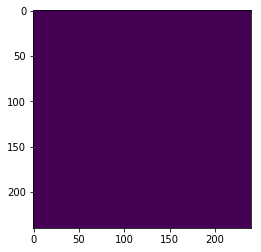

36


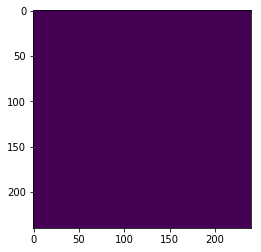

37


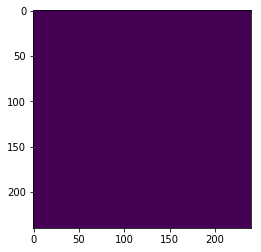

38


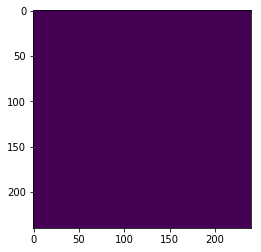

39


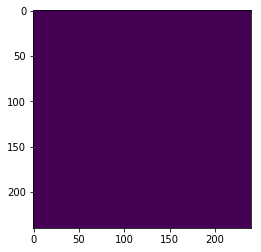

40


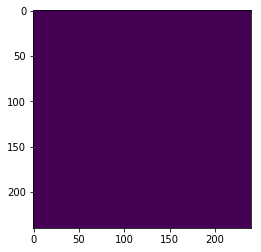

41


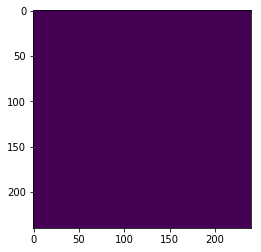

42


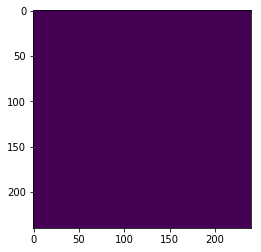

43


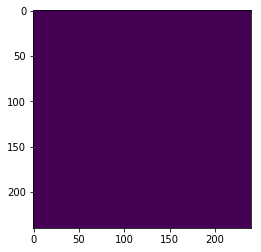

44


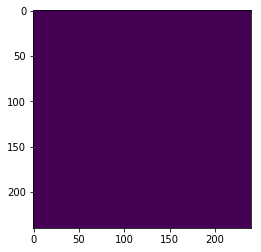

45


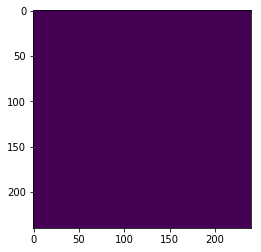

46


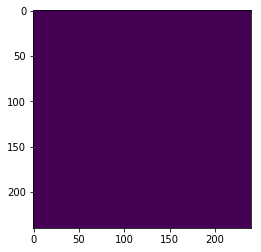

47


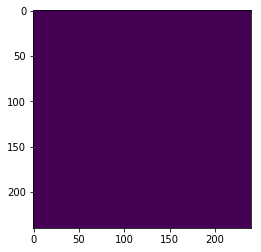

48


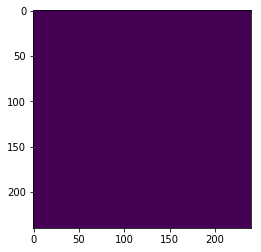

49


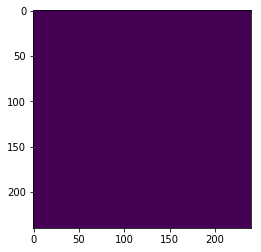

50


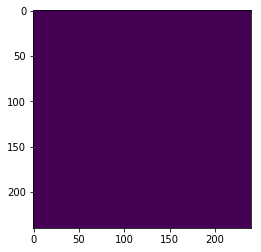

51


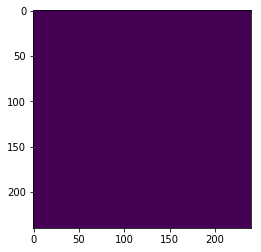

52


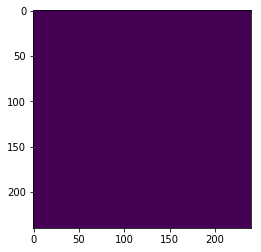

53


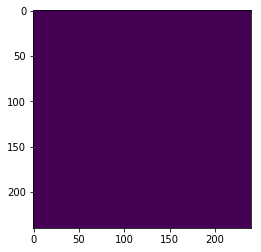

54


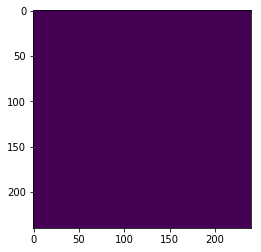

55


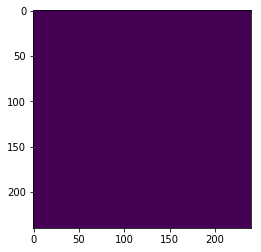

56


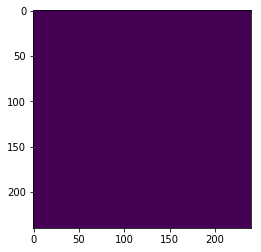

57


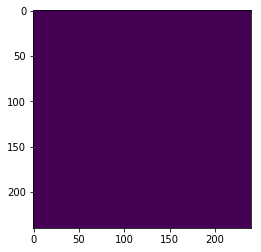

58


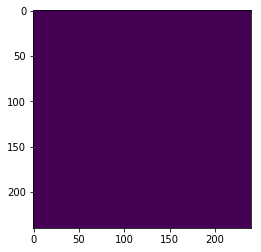

59


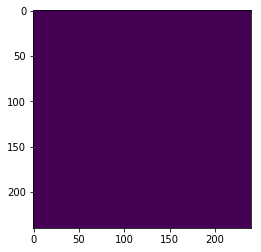

60


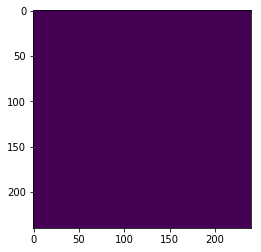

61


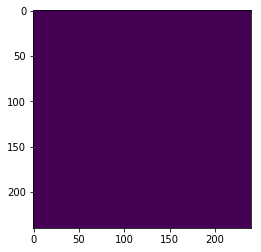

62


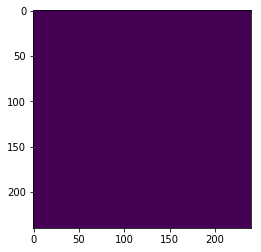

63


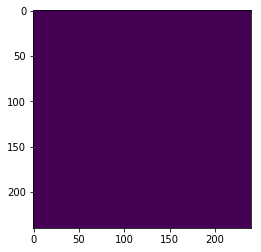

64


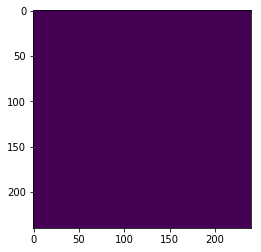

65


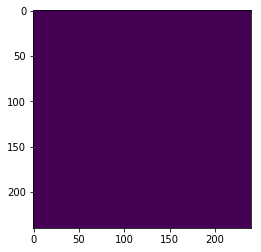

66


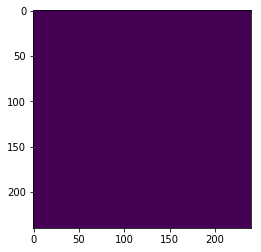

67


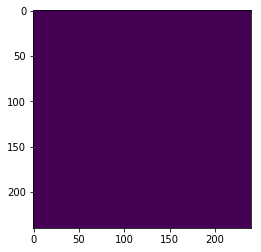

68


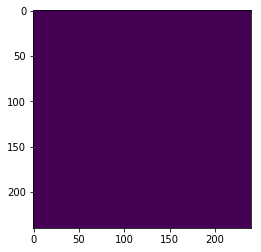

69


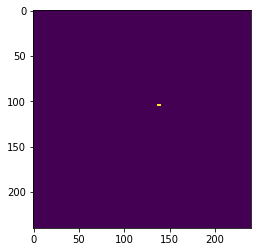

70


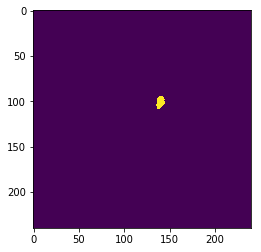

71


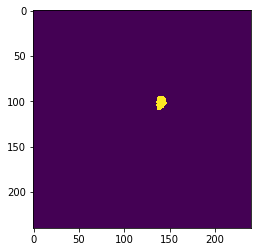

72


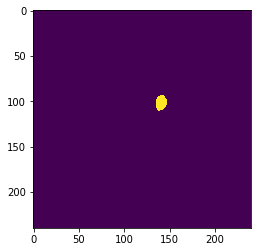

73


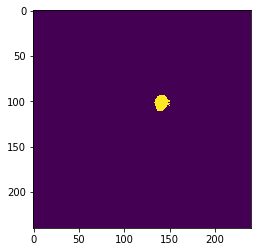

74


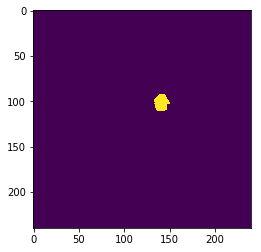

75


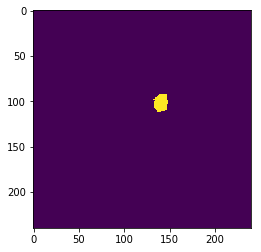

76


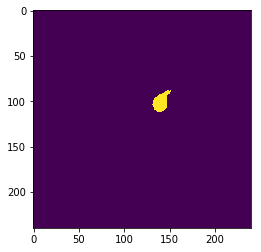

77


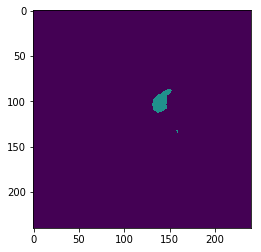

78


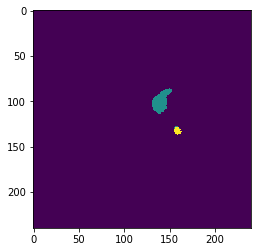

79


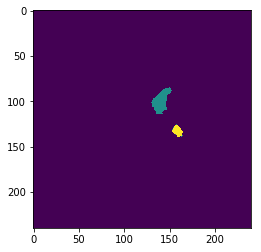

80


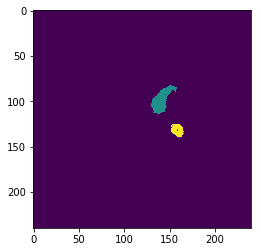

81


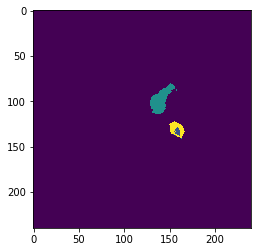

82


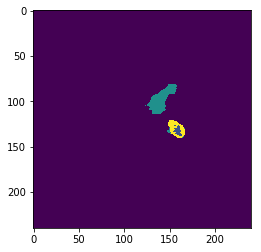

83


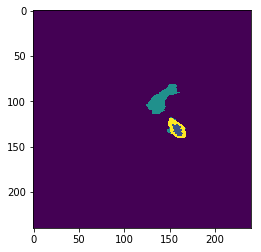

84


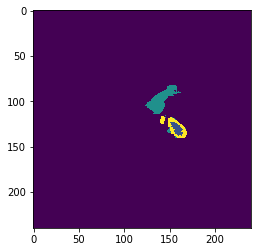

85


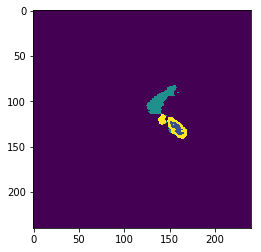

86


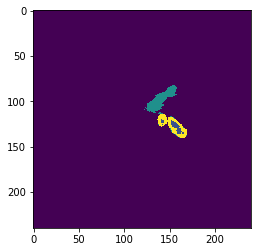

87


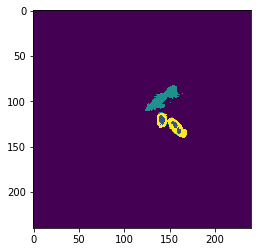

88


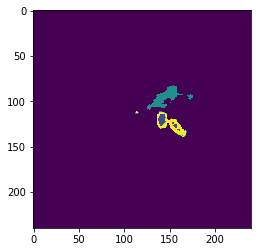

89


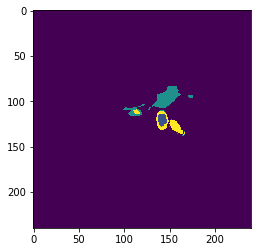

90


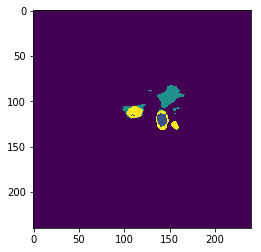

91


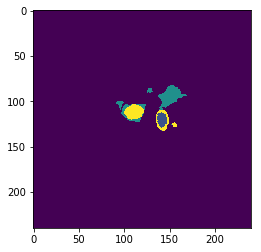

92


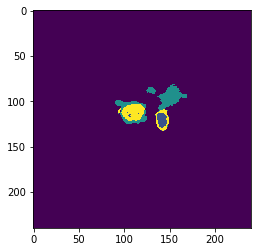

93


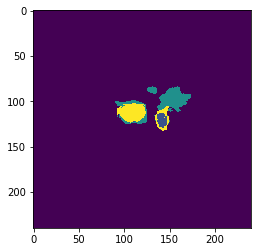

94


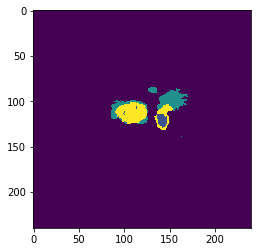

95


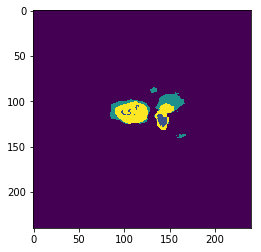

96


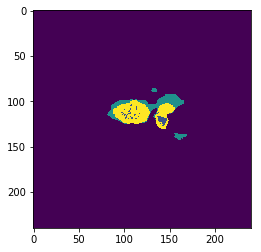

97


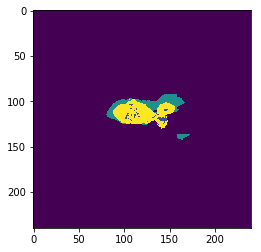

98


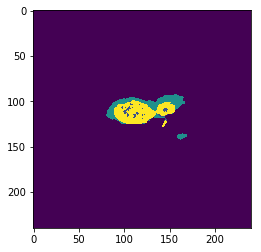

99


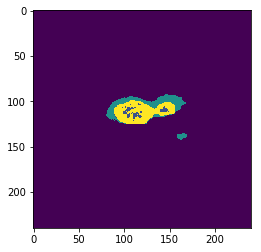

In [342]:
for i in range(0,100):
    plt.imshow(dims[0,:,:,i])
    print(i)
    plt.show()

In [346]:
2.98884610455318440.00233549+ 0.14019698+ 0.04583725+ 0.14620756

0.33457728

In [347]:
1/0.33457728

2.9888461045531844

<IPython.core.display.Javascript object>


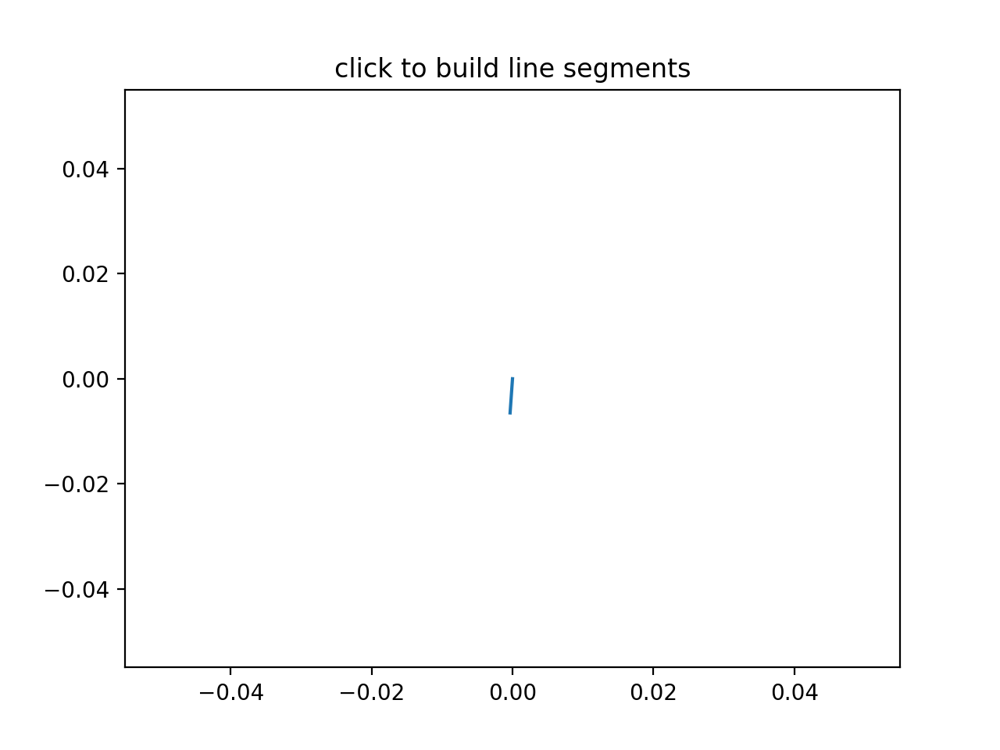

In [405]:
from matplotlib import pyplot as plt
%matplotlib notebook
class LineBuilder:
    def __init__(self, line):
        self.line = line
        self.xs = list(line.get_xdata())
        self.ys = list(line.get_ydata())
        self.cid = line.figure.canvas.mpl_connect('button_press_event', self)

    def __call__(self, event):
        print('click', event)
        if event.inaxes!=self.line.axes: return
        self.xs.append(event.xdata)
        self.ys.append(event.ydata)
        self.line.set_data(self.xs, self.ys)
        self.line.figure.canvas.draw()

fig = plt.figure()
ax = fig.add_subplot(111)
ax.set_title('click to build line segments')
line, = ax.plot([0], [0])  # empty line
linebuilder = LineBuilder(line)

plt.show()

In [195]:
(1.5)*4

6.0

In [16]:
def noisy1(image): # only for inputs
        
        row,col,ch= image.shape
        mean = 0
        var = 0.3
        sigma = var
        gauss = np.random.normal(mean,sigma,(row,col,ch))
        gauss = gauss.reshape(row,col,ch)
        
        noisy = image + gauss
        noisy = nd.gaussian_filter(noisy, sigma=(3, 3, 3), order=0)

        return noisy
def noisy2(image): 
    row,col,ch= image.shape
    mean = 0
    sigma = 0.3
    gauss = np.random.normal(mean,sigma,(row,col,ch))
    gauss = gauss.reshape(row,col,ch)
    noisy = image + gauss
    noisy = nd.gaussian_filter(noisy, sigma=(0.7, 0.7, 0.7), order=0)

    return noisy



     

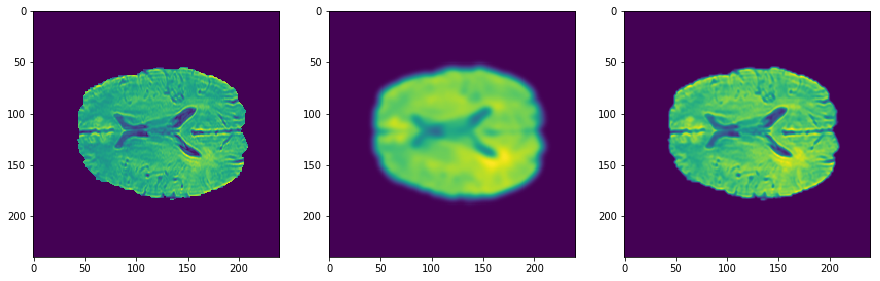

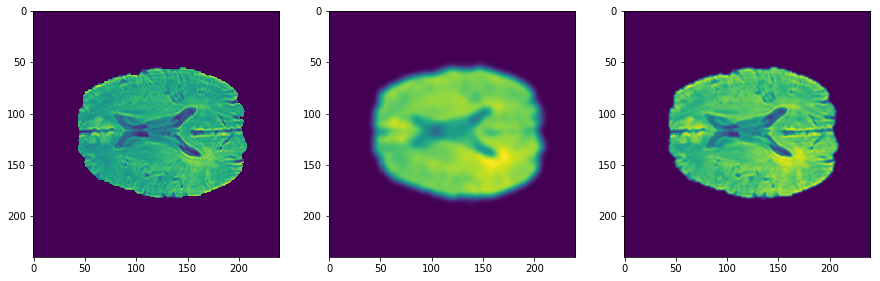

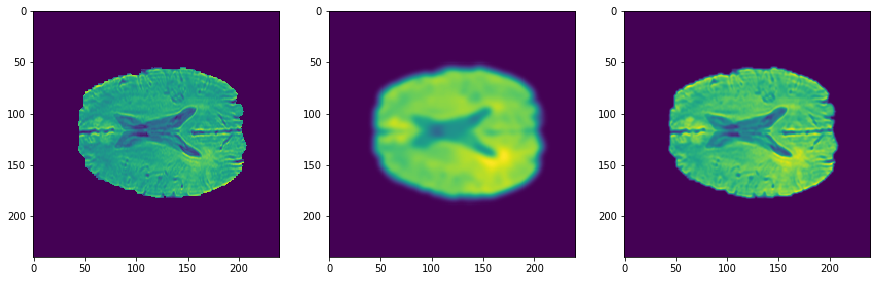

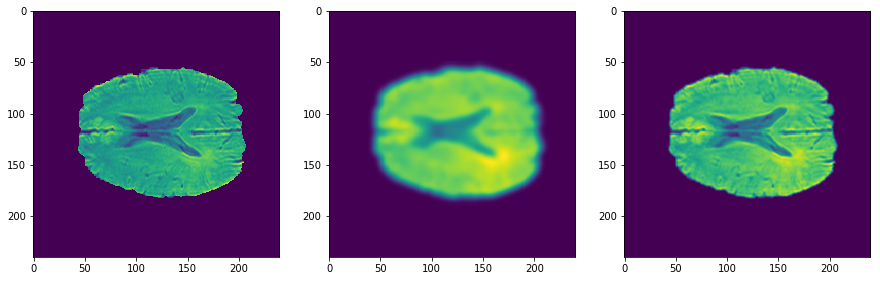

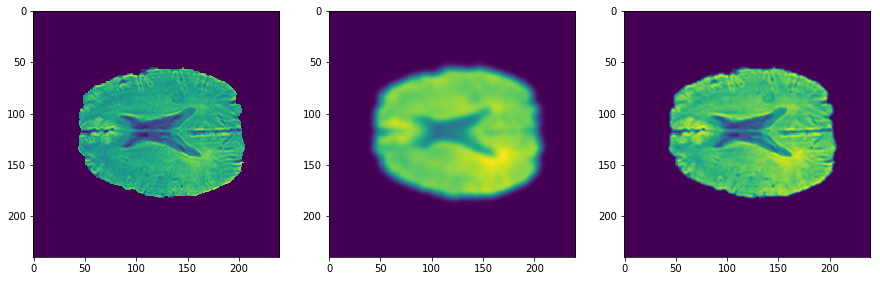

...

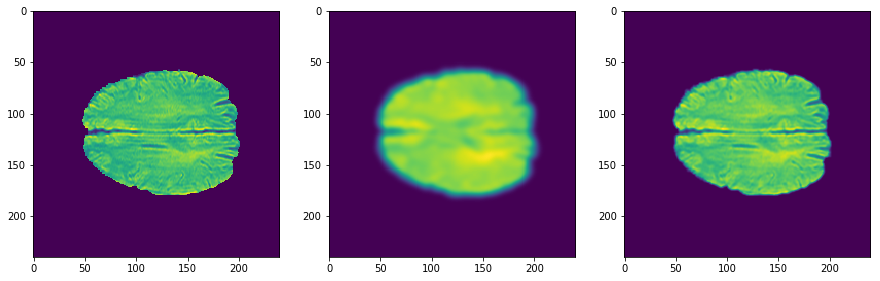

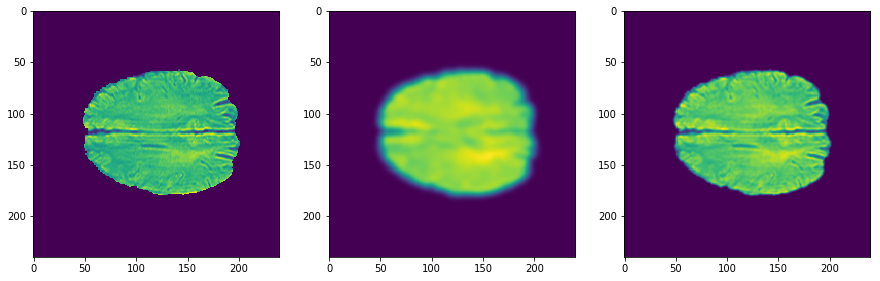

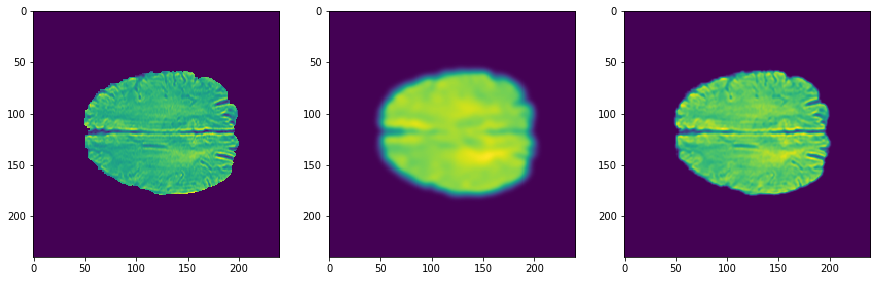

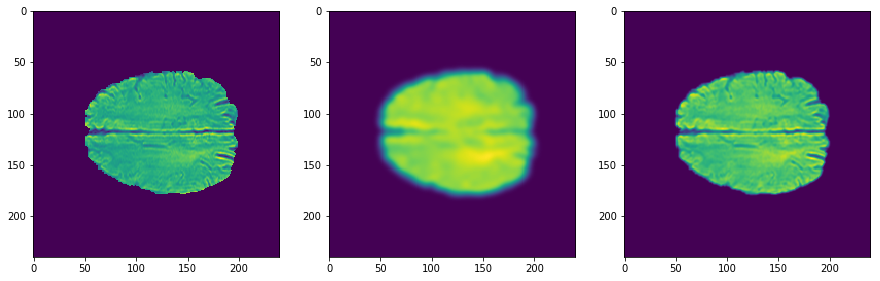

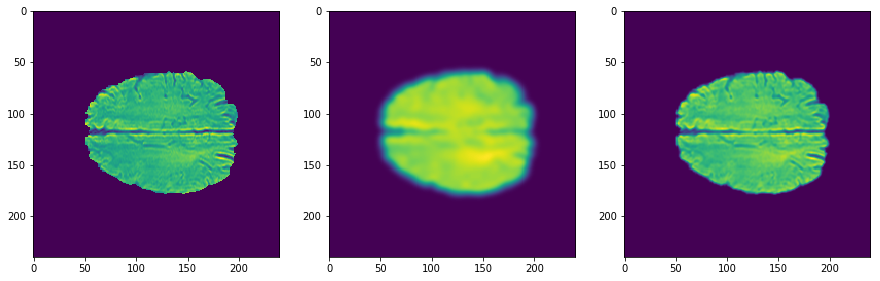

In [19]:
from skimage import exposure

def noisy_v_he2(patient=None,rows=20,base=80,mode=0): 
    
    # takes one patient
    # plot original img, noisy, HE, standarised, standarised+noise,standarised+he
    
     
#     im=next(dsi)
    if mode<4: image = im['img'][mode]
    else: image=im['seg_orig']
        
#     image=standardizer(np.array(image))
    noise=noisy1(np.array(image))
    noise2=noisy2(np.array(image))
    
    for i in range(base,base+rows):
        fig = plt.figure(figsize=(15,15))
        
        
        plt.subplot(1,3,1)
        plt.imshow(image[:,:,i])
        
        plt.subplot(1,3,2)
        plt.imshow(noise[:,:,i])
        
        plt.subplot(1,3,3)
        plt.imshow(noise2[:,:,i])
    

        plt.show()
    
noisy_v_he2()    
    

In [201]:
im=next(dsi)
image = im['img']
std=np.std(np.array(image))

noise=noisy1(np.array(image.squeeze(0)))
noise2=noisy2(np.array(image.squeeze(0)))

std1=np.std(np.array(noise))
std2=np.std(np.array(noise2))

print(std,std1,std2)
print()

(149.7429390411195, 128.5758122727958, 136.8960803308244)
()


In [214]:
def standardizer(img):
    img=torch.clamp(img,0,255).float()
    mean=img.mean()
    print(mean)
    std=img.std()
    img=img-mean
    img=img/std

    return(img)

image = im['img']
im_std=standardizer(image)
img_eq = exposure.equalize_hist(np.array(im_std))
img_eq2 = standardizer(torch.tensor(exposure.equalize_hist((np.array(image)))))

tensor(36.8111)
tensor(0.8412)


In [215]:
im_std.min(),im_std.max(),im_std.mean(),img_eq.min(),img_eq.max(),img_eq.mean()

(tensor(-0.4314),
 tensor(2.5569),
 tensor(-0.0004),
 0.8299742383512545,
 1.0,
 0.8514404199676086)

In [216]:
img_eq2.min(),img_eq2.max(),img_eq2.mean()

(tensor(-0.2959), tensor(4.1923), tensor(0.0861))

# Per Modality Analysis

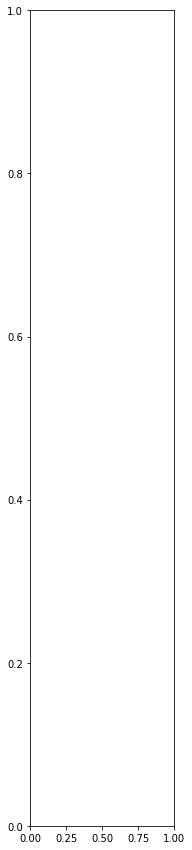

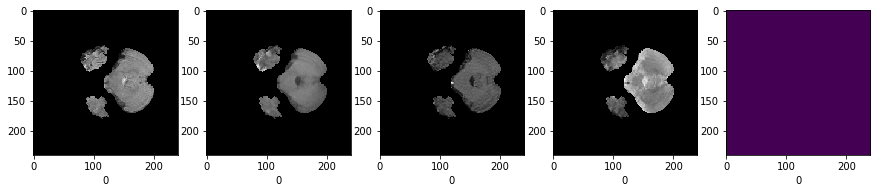

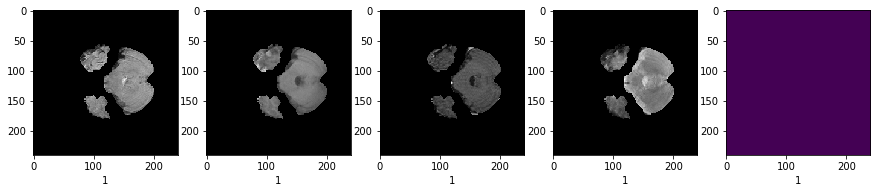

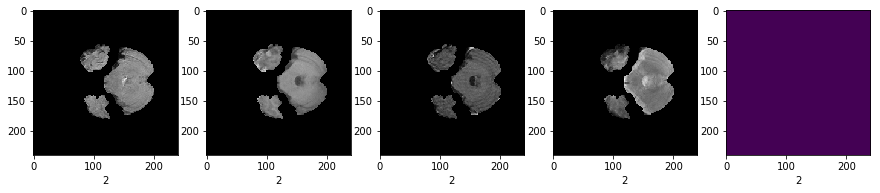

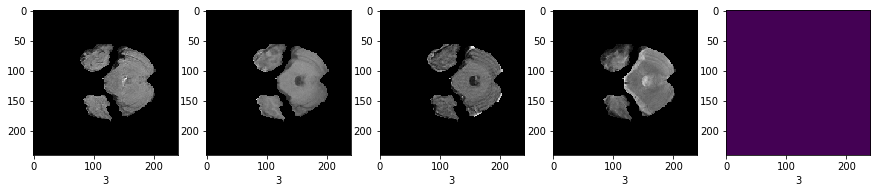

...

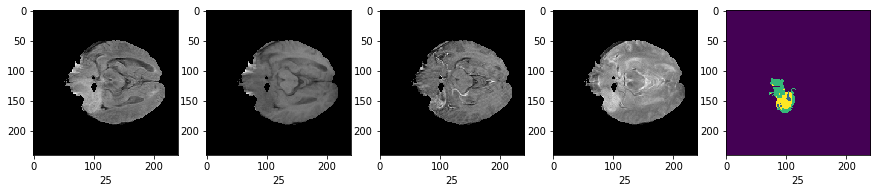

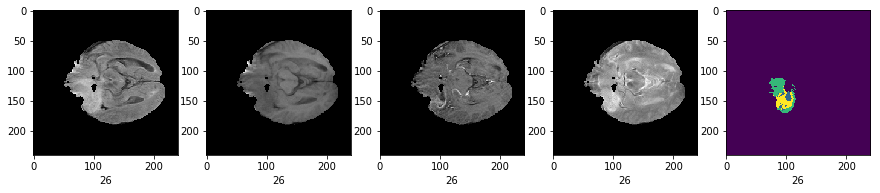

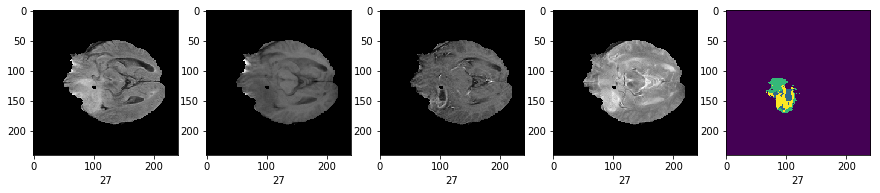

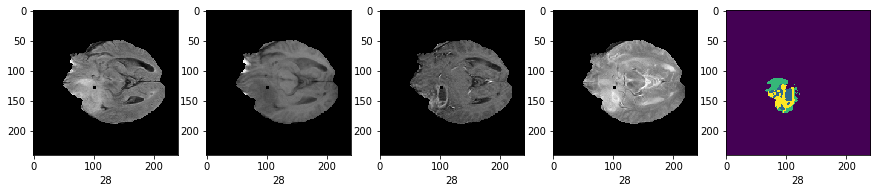

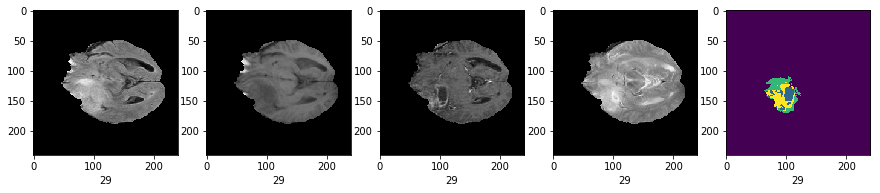

In [10]:
im=next(dsi)
image = im['img']
mask=im['seg_orig']
single_patient_two()

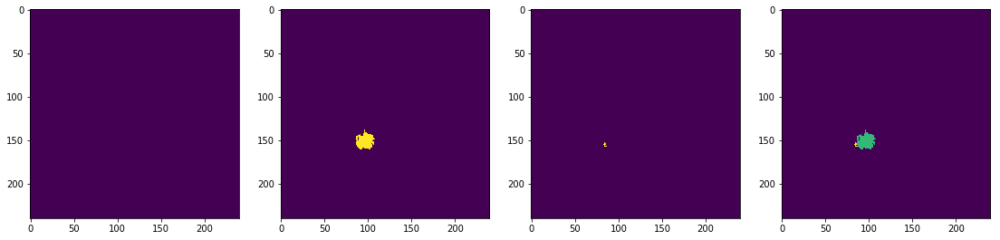

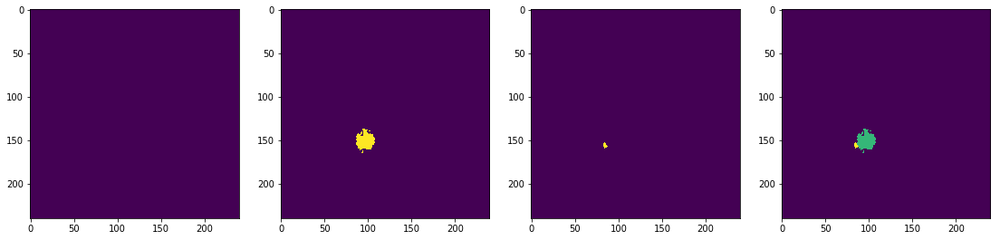

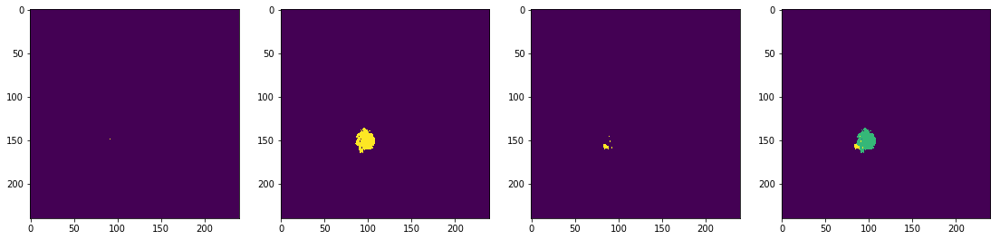

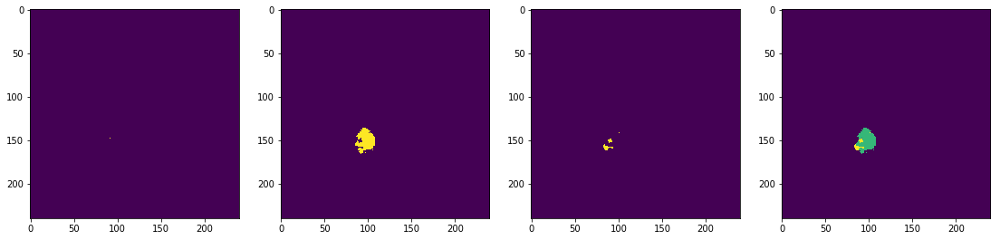

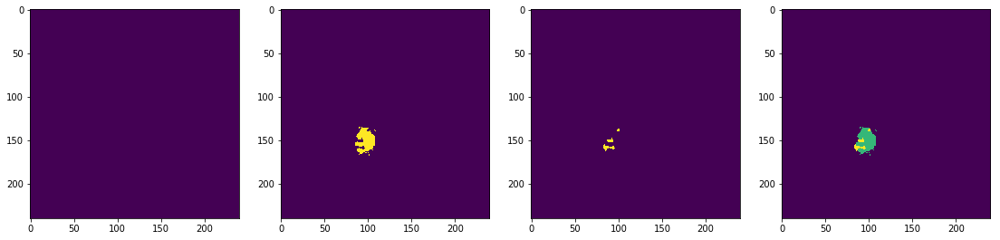

...

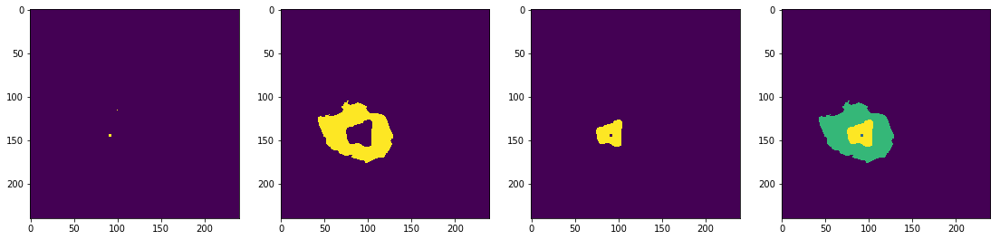

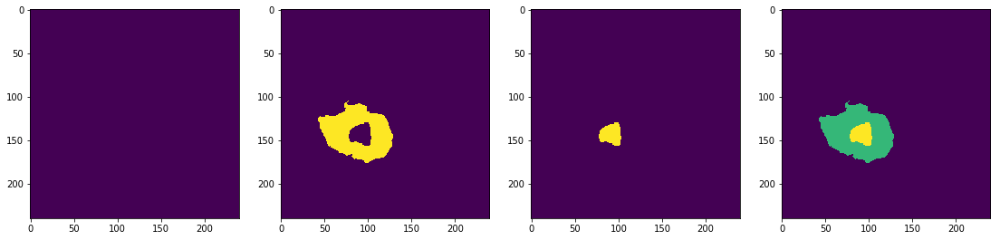

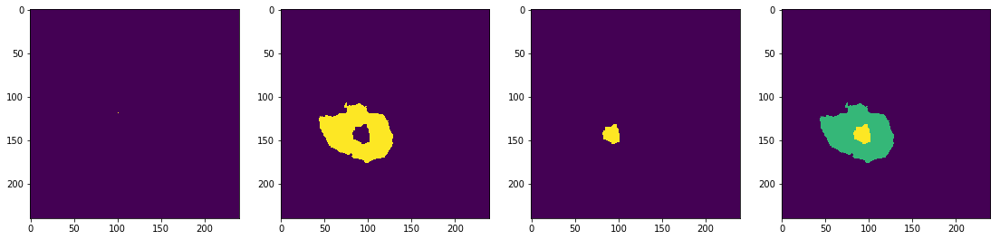

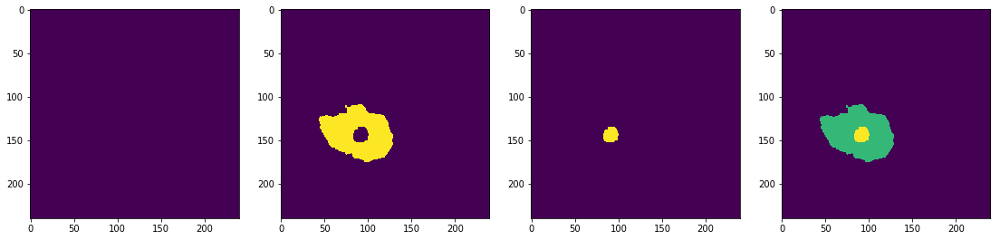

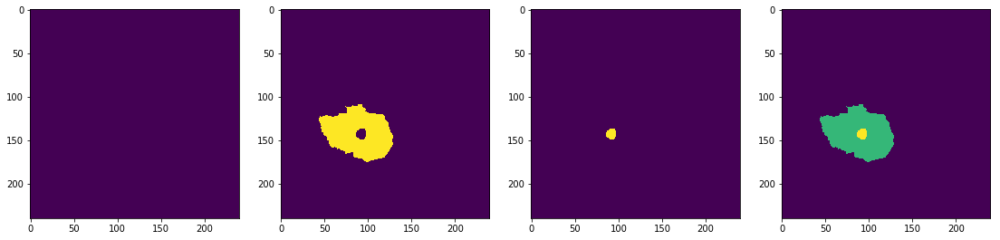

In [21]:
# seeing different classes compared to whole segment
# d=next(dsi)
d=im
img= im['img']
msk=im['mask']

for i in range(45,96):
    fig=plt.figure(figsize=(19,19))
    
    plt.subplot(1,4,1) # med[inner]
    plt.imshow(msk[1,:,:,i])
    
    plt.subplot(1,4,2)
    plt.imshow(msk[2,:,:,i]) # Whole[outer]
    
    
    plt.subplot(1,4,3)
    plt.imshow(msk[3,:,:,i]) # Smallest [inner of inner]
    
    
    plt.subplot(1,4,4)
    plt.imshow(d['seg_orig'][:,:,i])
    plt.show()

In [14]:
liq=msk[1,:,:,:]
tice=img[2,:,:,:]

In [15]:
liq.size(),tice.size()

(torch.Size([240, 240, 155]), torch.Size([240, 240, 155]))

In [16]:
tice[liq].min(),tice[liq].mean(),tice[liq].max()

(tensor(-0.2784, dtype=torch.float64),
 tensor(1.1132, dtype=torch.float64),
 tensor(4.4475, dtype=torch.float64))

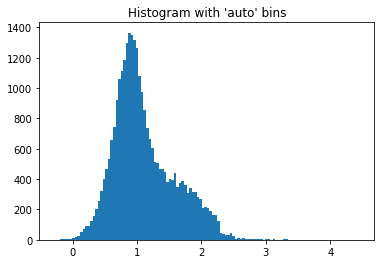

In [17]:
np.histogram( tice[liq])
# a = np.hstack((rng.normal(size=1000),rng.normal(loc=5, scale=2, size=1000)))
plt.hist(tice[liq], bins='auto')  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

In [18]:
tice[tice>5]

tensor([5.2907, 5.8397, 6.0947,  ..., 5.0554, 5.0750, 5.2515],
       dtype=torch.float64)

In [19]:
liq.size()

torch.Size([240, 240, 155])

In [20]:
x = liq.unsqueeze(0) # dimensions of non-zero Mask as cube
 

non_zero = (x!=0).nonzero()  # Contains non-zero indices for all 4 dims
h_min = non_zero[:, 1].min()
h_max = non_zero[:, 1].max()
w_min = non_zero[:, 2].min()
w_max = non_zero[:, 2].max()
d_min = non_zero[:, 3].min()
d_max = non_zero[:, 3].max()
print(h_min,h_max,w_min,w_max,d_min,d_max)

(tensor(110), tensor(168), tensor(44), tensor(117), tensor(47), tensor(93))


In [24]:
cube=tice[h_min-5:h_max+5,w_min-5:w_max+5,d_min-5:d_max+5]

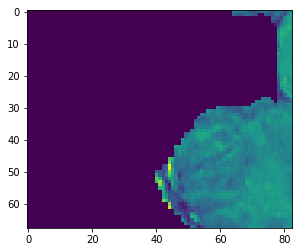

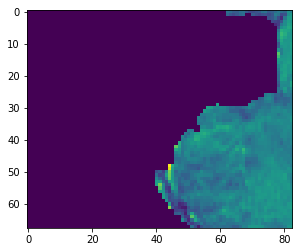

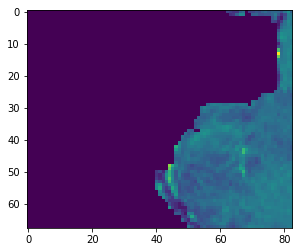

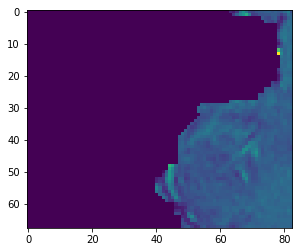

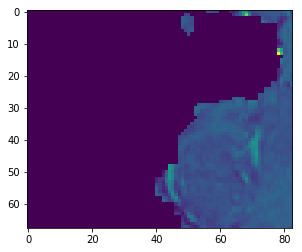

...

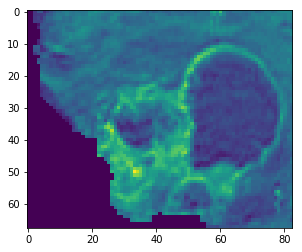

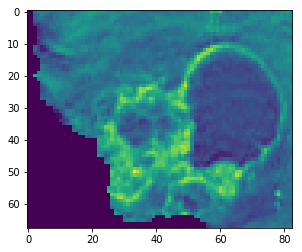

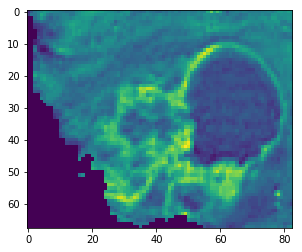

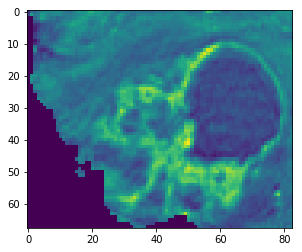

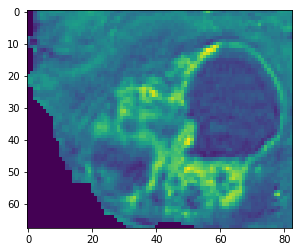

In [25]:
for i in range(0,30):
    plt.imshow(cube[:,:,i])
    plt.show()

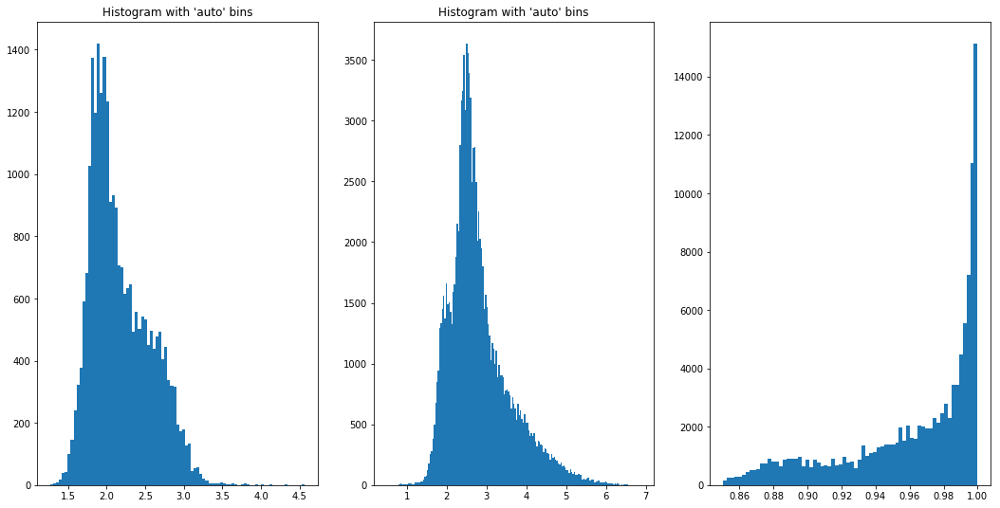

In [105]:
fig=plt.figure(figsize=(18,9))
plt.subplot(1,3,1)
plt.hist(tice[liq], bins='auto')  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")

plt.subplot(1,3,2)
plt.hist(cube[cube>0], bins='auto')  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")

plt.subplot(1,3,3)
plt.hist(cube_he.flatten()[cube_he.flatten()>0.85], bins='auto') # 0 s
plt.show()



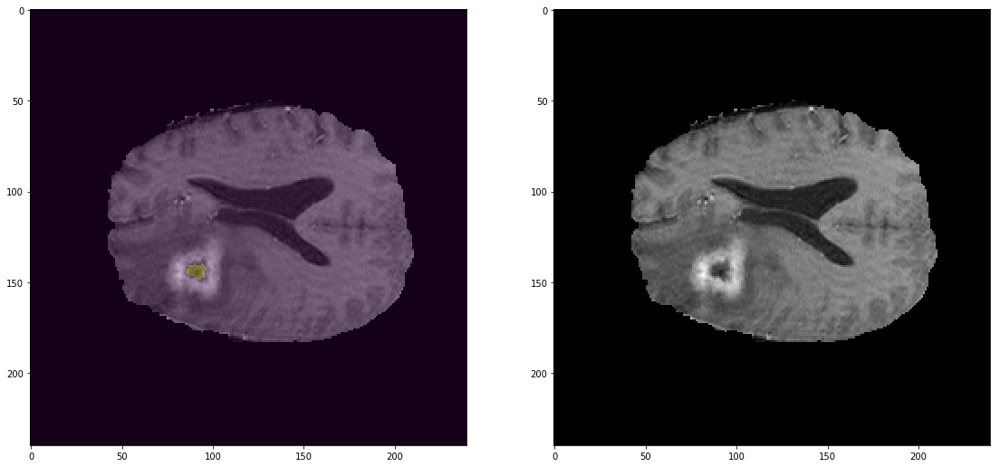

In [27]:
liq,tice
i=90
fig=plt.figure(figsize=(19,19))
plt.subplot(1,2,1)
plt.imshow(tice[:,:,i],cmap='gray')
plt.imshow(liq[:,:,i], interpolation='none', alpha=0.3)

plt.subplot(1,2,2)
plt.imshow(tice[:,:,i],cmap='gray')




plt.show()  # area of intrest has lower intesity

In [28]:
from numpy import percentile

quartiles = percentile(tice[liq], [25, 50, 75])  # exact region
data_min, data_max = tice[liq].min(), tice[liq].max()
print('Min: %.3f' % data_min)
print('Q1: %.3f' % quartiles[0])
print('Median: %.3f' % quartiles[1])
print('Q3: %.3f' % quartiles[2])
print('Max: %.3f' % data_max)

Min: -0.278
Q1: 0.781
Median: 1.016
Q3: 1.388
Max: 4.447


In [29]:
quartiles = percentile(cube[cube>0], [25, 50, 75])
data_min, data_max = cube[cube>0].min(), cube[cube>0].max() # Box around region
print('Min: %.3f' % data_min) 
print('Q1: %.3f' % quartiles[0])
print('Median: %.3f' % quartiles[1])
print('Q3: %.3f' % quartiles[2])
print('Max: %.3f' % data_max)

Min: 0.016
Q1: 1.467
Median: 1.898
Q3: 2.330
Max: 9.722


In [49]:
from skimage import exposure
cube_he = exposure.equalize_hist(np.array(tice))
cube_he=cube_he[h_min-5:h_max+5,w_min-5:w_max+5,d_min-5:d_max+5]

mask_cube=liq[h_min-5:h_max+5,w_min-5:w_max+5,d_min-5:d_max+5]

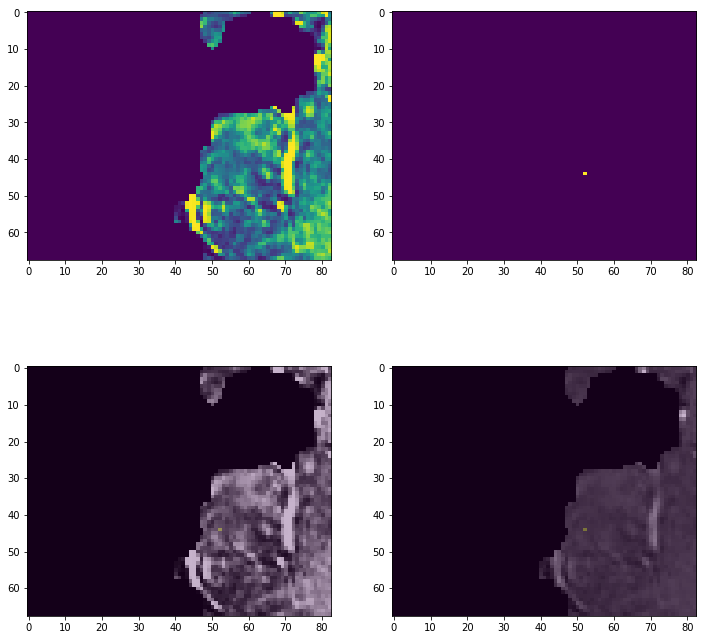

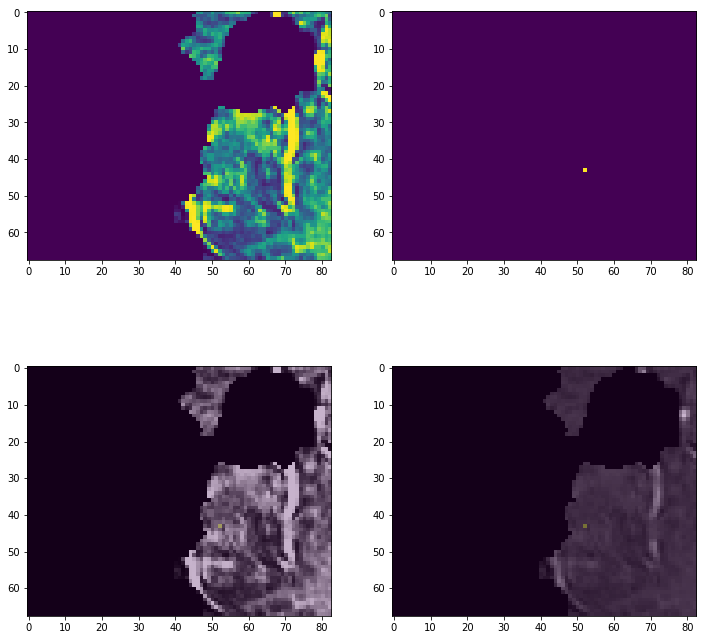

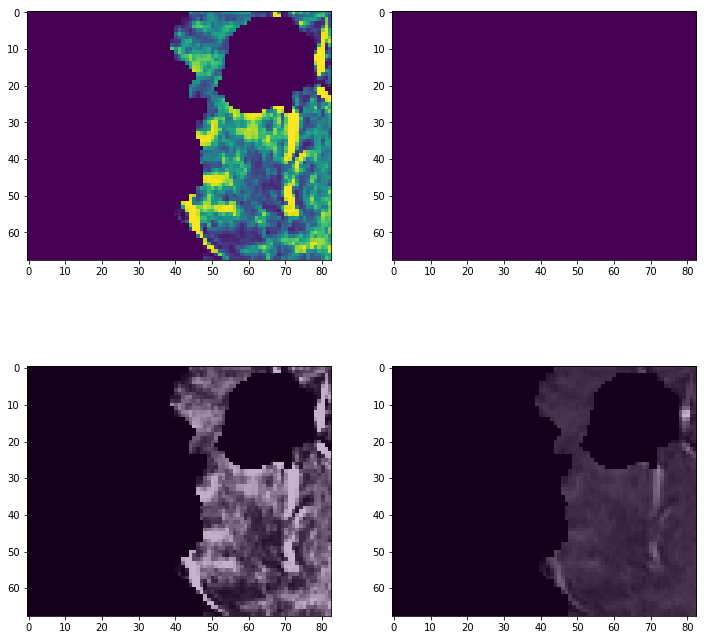

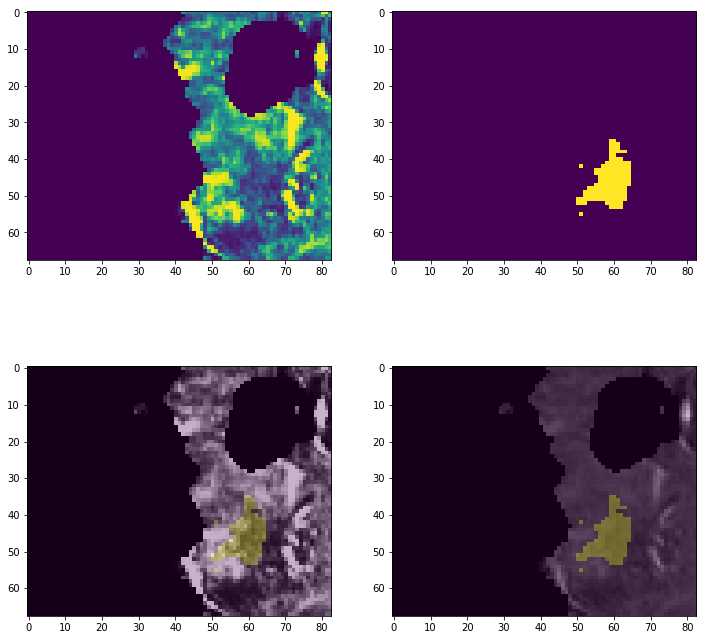

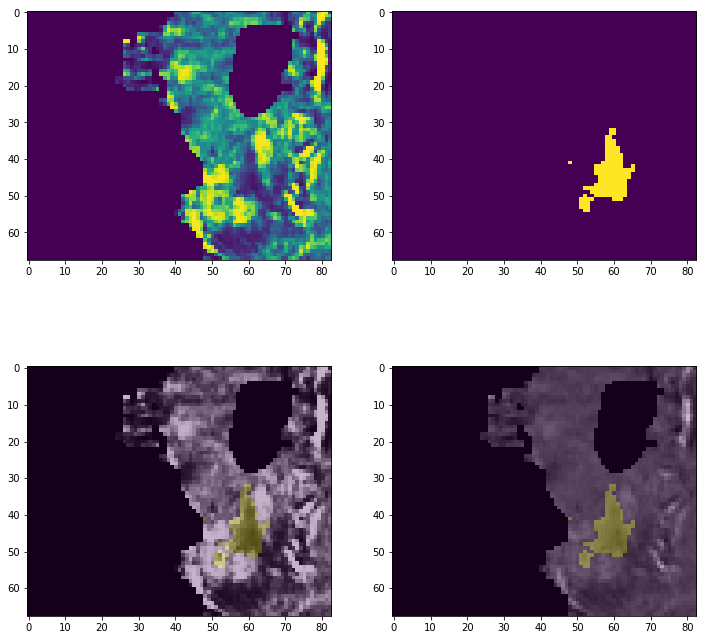

...

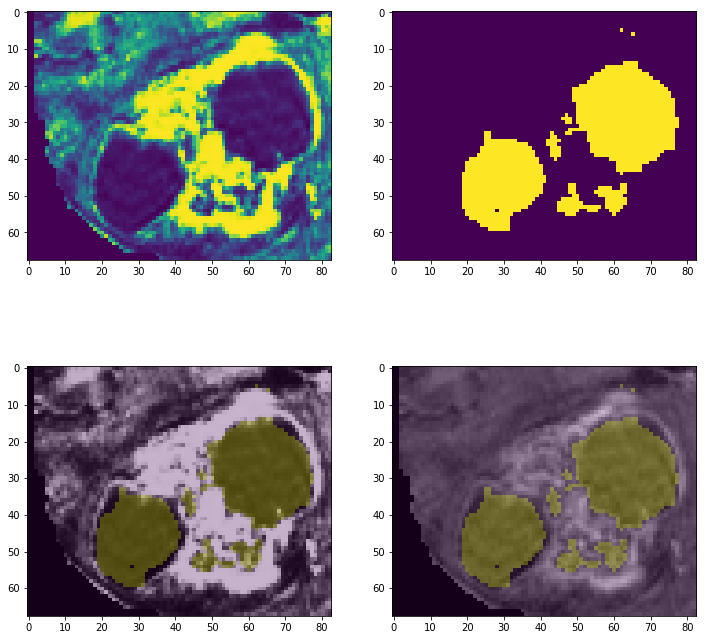

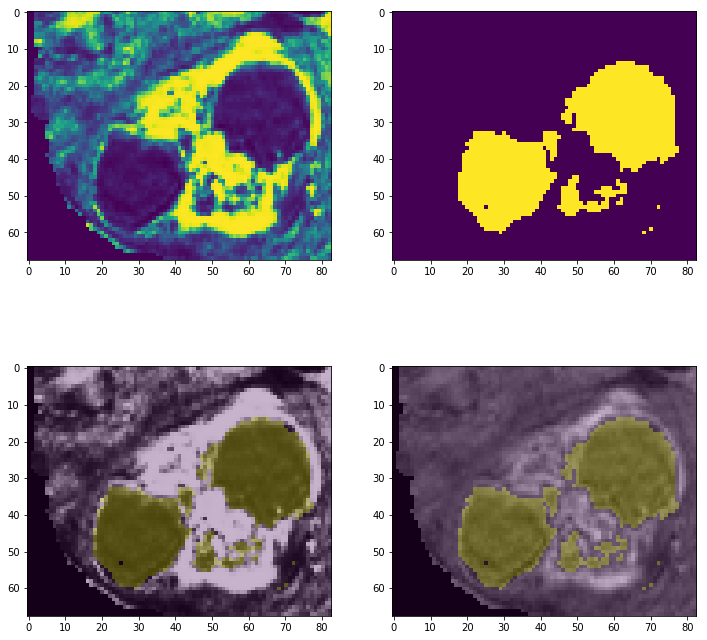

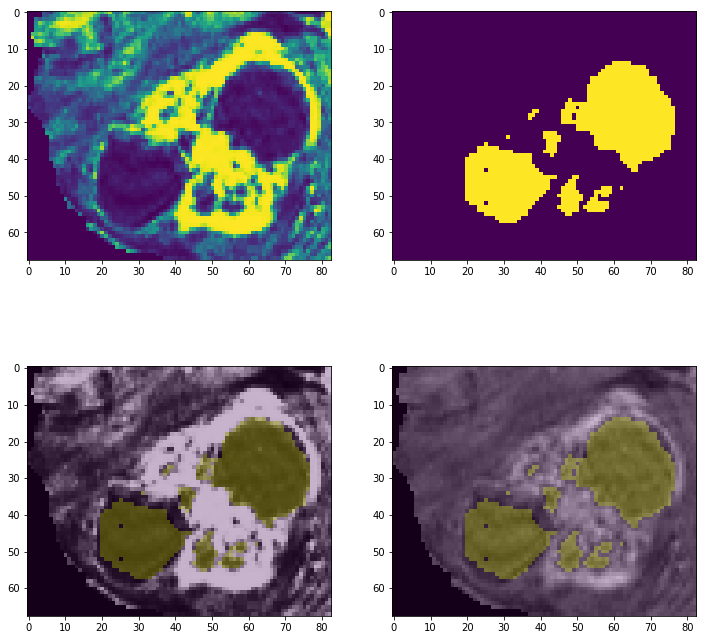

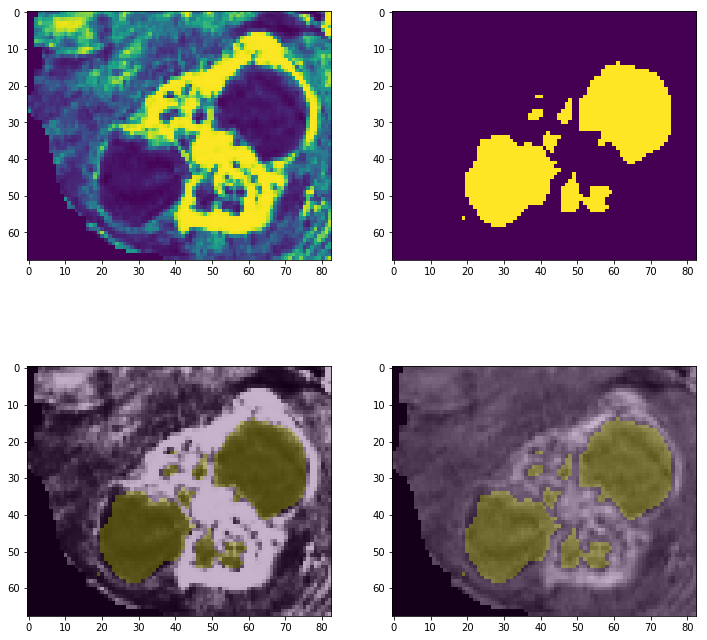

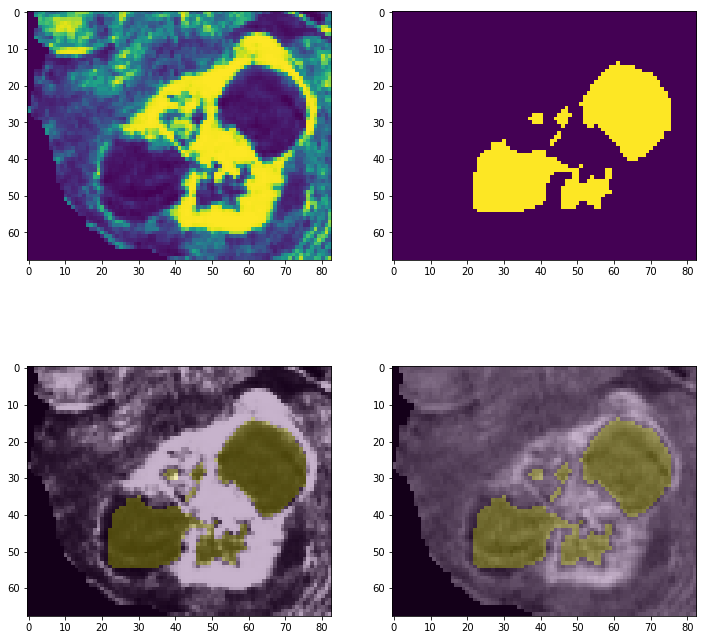

In [54]:
# HE shows much more visible results
for i in range(5,40):
    fig=plt.figure(figsize=(12,12))
    plt.subplot(2,2,1)
    plt.imshow(cube_he[:,:,i]) # alternate with cube_he 
    
    plt.subplot(2,2,2)
    plt.imshow(mask_cube[:,:,i])
    
    plt.subplot(2,2,3)
    plt.imshow(cube_he[:,:,i],cmap='gray')
    plt.imshow(mask_cube[:,:,i], interpolation='none', alpha=0.3)
    
    plt.subplot(2,2,4)
    plt.imshow(cube[:,:,i],cmap='gray')
    plt.imshow(mask_cube[:,:,i], interpolation='none', alpha=0.3)
    
    plt.show()

In [27]:
fig=plt.figure(figsize=(18,9))
plt.subplot(1,2,1)
plt.hist(tice[liq], bins='auto')  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")

plt.subplot(1,2,2)
plt.hist(cube[cube>0], bins='auto')  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

plt.subplot()

NameError: name 'tice' is not defined

In [43]:
import SimpleITK as sitk
!pip install SimpleITK

Vendor:  continuum
Product: anaconda
Message: trial mode expires in 28 days
/Users/admin/anaconda2/lib/python2.7/site-packages/cryptography/hazmat/primitives/constant_time.py:26: CryptographyDeprecationWarning: Support for your Python version is deprecated. The next version of cryptography will remove support. Please upgrade to a 2.7.x release that supports hmac.compare_digest as soon as possible.
  utils.DeprecatedIn23,


In [35]:
img=d['img']

In [50]:
image=np.array(img[0,:,:,30])
img=sitk.ReadImage(image)
data=sitk.GetArrayFromImage(img)
print type(data)
img_data=sitk.Cast(img,sitk.sitkFloat32)
img_mask=sitk.BinaryNot(sitk.BinaryThreshold(img_data, 0, 0))
corrected_img = sitk.N4BiasFieldCorrection(img, img_mask)
mask=input('Enter the name of the mask image to be saved : ')
sitk.WriteImage(img_mask,mask)
new_img=input('Enter the name of the Bias Field Corrected Image : ')
sitk.WriteImage(corrected_img,new_img)

NotImplementedError: Wrong number or type of arguments for overloaded function 'ReadImage'.
  Possible C/C++ prototypes are:
    itk::simple::ReadImage(std::vector< std::string,std::allocator< std::string > > const &,itk::simple::PixelIDValueEnum)
    itk::simple::ReadImage(std::string const &,itk::simple::PixelIDValueEnum)


(tensor(255.), tensor(255.), tensor(255.))


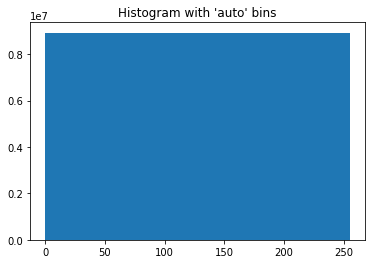

In [59]:
d=next(dsi)
img=torch.clamp(d['img'],0,255).float()
msk=d['mask']
tice=d['img'][0]


liq=msk[1,:,:,:]
tice=img[2,:,:,:]

liq.size(),tice.size()

print(tice[liq].min(),tice[liq].mean(),tice[liq].max())

np.histogram( tice.flatten())
# a = np.hstack((rng.normal(size=1000),rng.normal(loc=5, scale=2, size=1000)))
plt.hist(tice.flatten(), bins='auto')  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

In [44]:
fig=plt.figure(figsize=(18,9))
plt.subplot(1,3,1)
plt.hist(tice[liq], bins='auto')  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")

plt.subplot(1,3,2)
plt.hist(cube[cube>0], bins='auto')  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")

plt.subplot(1,3,3)
plt.hist(cube_he.flatten()[cube_he.flatten()>0.85], bins='auto') # 0 s
plt.show()




NameError: name 'tice' is not defined

In [ ]:
def quat(inve):
    eq255=len(inve[inve>255])+len(inve[inve==255])


    quat99=len(inve[inve>quartiles[5]])

    total=len(inve.flatten())+0.1

    print('Percentages of above 99% quat and 255: ',quat99/total * 100, eq255/total *100)

def histogram_vis(z,name):
    plt.hist(np.array(z)) 
    plt.title(name) 
    
    hist,bins = np.histogram(z) 
    
    plt.axvline(z.float().mean(), color='k', linestyle='dashed', linewidth=1)

    _, max_ = plt.ylim()
    plt.text(z.float().mean() + z.float().mean()/10, 
             max_ - max_/10, 
             'Mean: {:.2f}'.format(z.float().mean()))
    
    plt.axvline(z.float().mode()[0], color='g', linestyle='dashed', linewidth=1)

    _, max_ = plt.ylim()
    plt.text(z.float().mode()[0] + z.float().mode()[0]/10, 
             max_ - max_/10, 
             'Mean: {:.2f}'.format(z.float().mode()[0]))
    
    

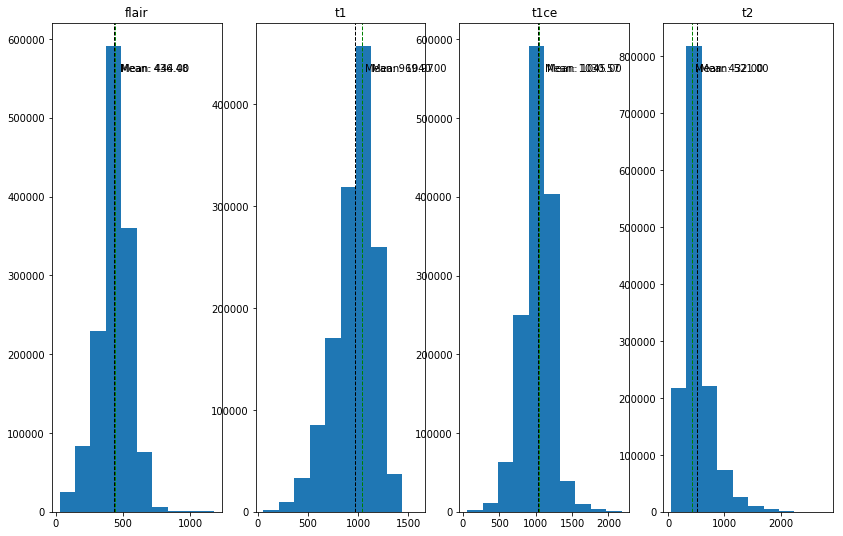

KeyboardInterrupt: 

In [30]:
cut=False
for i in range(0,3):
    d=next(dsi)
    
    fig=plt.figure(figsize=(14,9))
    
    img=torch.clamp(d['img'],0,255).float()
    msk=d['mask']
    tice=d['img'][0][20:212,20:212,15:143]
    
    if cut: tice=torch.clamp(tice,0,255)
    z=tice.flatten()[tice.flatten()>0]
    plt.subplot(1,4,1)
    histogram_vis(z,'flair')
#     hist,bins = np.histogram(z) 
#     print hist 
#     print bins
 
    tice=d['img'][1][20:212,20:212,15:143]
    if cut: tice=torch.clamp(tice,0,255)
    z=tice.flatten()[tice.flatten()>0]
    plt.subplot(1,4,2)
    histogram_vis(z,'t1')
    
    
    tice=d['img'][2][20:212,20:212,15:143]
    if cut: tice=torch.clamp(tice,0,255)
    z=tice.flatten()[tice.flatten()>0]
    plt.subplot(1,4,3)
    histogram_vis(z,'t1ce') 
    

    tice=d['img'][3][20:212,20:212,15:143]
    if cut: tice=torch.clamp(tice,0,255)
    z=tice.flatten()[tice.flatten()>0]
    plt.subplot(1,4,4)
    histogram_vis(z,'t2')

    plt.show()
    
    

In [153]:
d=next(dsi)
img=d['img']

In [8]:
from numpy import percentile
inve=d['img']
quartiles = percentile(inve, [25, 50, 75,90,95,99,99.5])  # exact region
data_min, data_max = inve.min(), inve.max()
print('Min: %.3f' % data_min)
print('Q1: %.3f' % quartiles[0])
print('Median: %.3f' % quartiles[1])
print('Q3: %.3f' % quartiles[2])
print('Q4: %.3f' % quartiles[3])
print('Q5: %.3f' % quartiles[4])
print('Q6: %.3f' % quartiles[5])
print('Q7: %.3f' % quartiles[6])


print('Max: %.3f' % data_max)
eq255=len(inve[inve>255])+len(inve[inve==255])


quat99=len(inve[inve>quartiles[5]])

total=len(inve.flatten())+0.1

print('Percentages of above 99% quat and 255: ', eq255/total, quat99/total)


Min: 0.000
Q1: 0.000
Median: 0.000
Q3: 0.000
Q4: 274.000
Q5: 321.000
Q6: 429.000
Q7: 482.000
Max: 1264.000
('Percentages of above 99% quat and 255: ', 0.1202978827276605, 0.009872787830777363)


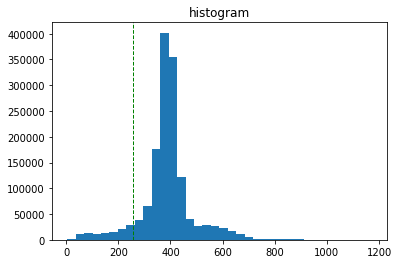

[ 31716  59470 254887 948639 103569  54532   5467   2770    307     31]
[   4.   120.7  237.4  354.1  470.8  587.5  704.2  820.9  937.6 1054.3
 1171. ]
('Percentages of above 99% quat and 255: ', 19.358717920311516, 92.75113161247172)


In [20]:
# img=torch.clamp(d['img'],0,255).float()
msk=d['mask']
tice=d['img'][0][20:212,20:212,15:143]

z=tice.flatten()[tice.flatten()>0]

plt.hist(np.array(z),bins=int(180/5)  ) 
plt.title("histogram") 

plt.axvline(255, color='g', linestyle='dashed', linewidth=1)

plt.show()

hist,bins = np.histogram(z) 
print hist 
print bins 
quat(z)


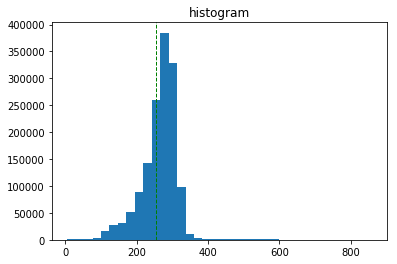

[  4682  86467 467032 884375  10090   4653   3113    712    233     31]
[  5.   90.3 175.6 260.9 346.2 431.5 516.8 602.1 687.4 772.7 858. ]
('Percentages of above 99% quat and 255: ', 0.6067518956805519, 66.63445528261795)


In [21]:
tice=d['img'][1][20:212,20:212,15:143]

# tice=torch.clamp(tice,0,255)

z=tice.flatten()[tice.flatten()>0]

plt.hist(np.array(z),bins=int(180/5)) 
plt.title("histogram") 
plt.axvline(255, color='g', linestyle='dashed', linewidth=1)
plt.show()

hist,bins = np.histogram(z) 
print hist 
print bins 

quat(z)

In [13]:
z.flatten().float().mode()[0]

tensor(288.)

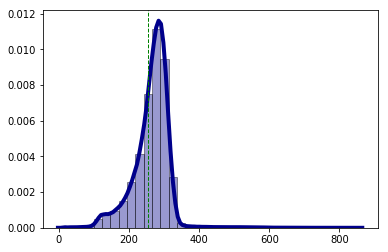

In [22]:
import seaborn as sns

sns.distplot(z, hist=True, kde=True, 
             bins=int(180/5), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})
plt.axvline(255, color='g', linestyle='dashed', linewidth=1)

plt.show()

In [ ]:
def mode_std(z):
    mode=z.float().mode()[0]
    std=(z-mode)**2
    return torch.sqrt(std.sum()/len(std))
    
    
    

In [80]:
def density_plot(mode,howmany,cut=False): # modes: 0-3
    chart1, ax1 = plt.subplots()
    chart2, ax2 = plt.subplots()
    chart3, ax3 = plt.subplots()
    for i in range(0,howmany):
        d=next(dsi)

        msk=d['mask']
        tice=d['img'][mode][20:212,20:212,15:143] # tice is any modality depending on mode


        if cut: tice=torch.clamp(tice,0,255)
        z=tice.flatten()[tice.flatten()>0].float() # dont consider background
        sns.distplot(z, hist=False, kde=True, kde_kws = {'linewidth': 1},ax=ax1)


        # mean
        meanz=(z-z.mean())/z.std()
        sns.distplot(meanz, hist=False, kde=True, kde_kws = {'linewidth': 1},ax=ax2)

        #mode
        modez=(z-z.mode()[0])/mode_std(z)
        sns.distplot(modez, hist=False, kde=True, kde_kws = {'linewidth': 1},ax=ax3)
        
    plt.show()


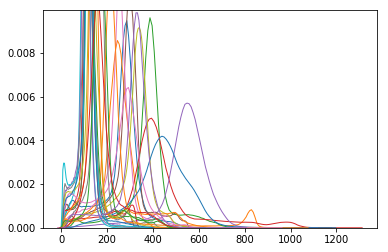

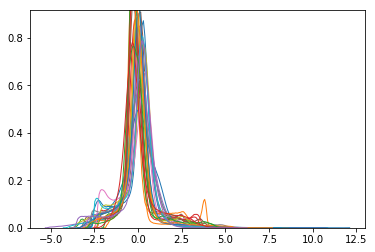

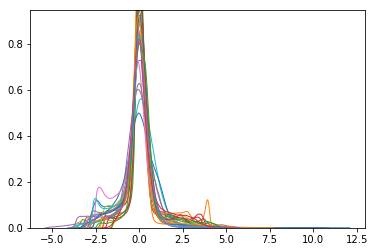

In [91]:
density_plot(0,25)

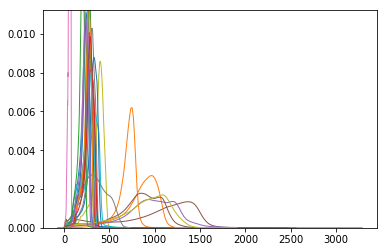

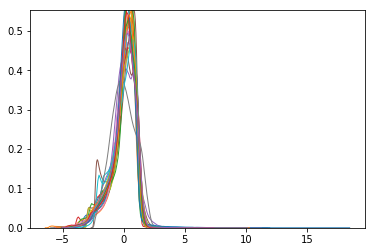

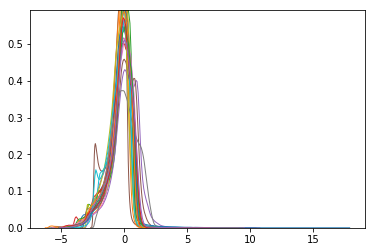

In [92]:
density_plot(1,25)

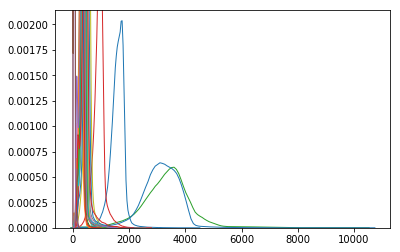

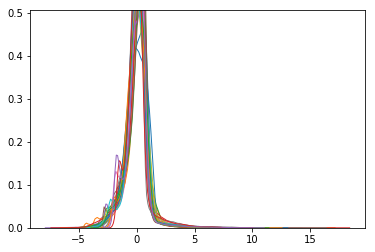

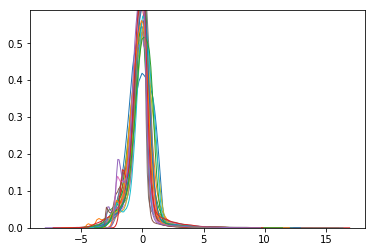

In [93]:
density_plot(2,25)

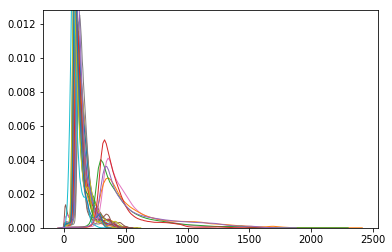

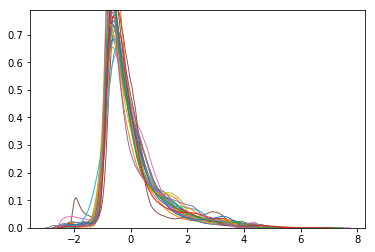

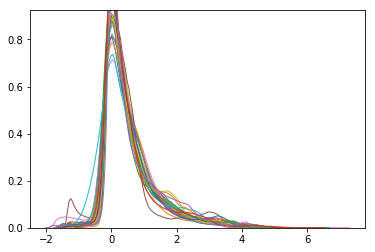

In [94]:
density_plot(3,25)

In [249]:
d=next(dsi)
    
#     fig=plt.figure(figsize=(14,9))

img=torch.clamp(d['img'],0,255).float()
msk=d['seg_orig']
tice=d['img'][0][20:212,20:212,15:143]
z=tice.flatten()[tice.flatten()>0].float()

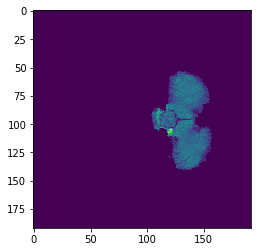

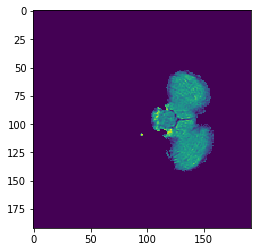

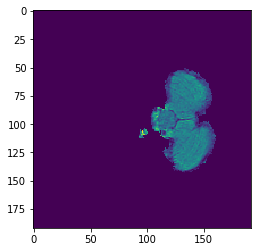

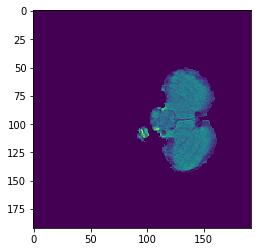

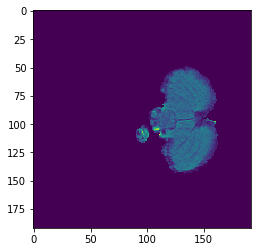

...

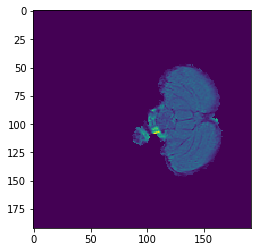

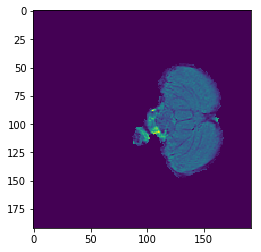

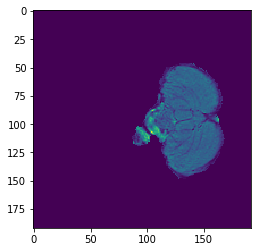

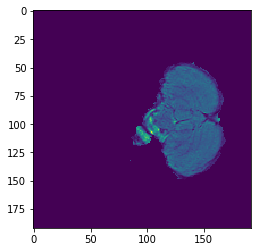

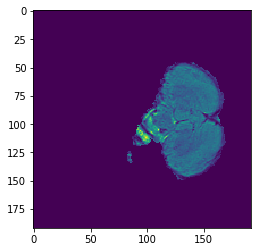

In [250]:

for i in range(0,12):
    plt.imshow(tice[:,:,i])
    plt.show()

In [136]:
tice.size()

torch.Size([192, 192, 128])

In [142]:
64,64,48

6

In [189]:
# img=torch.clamp(d['img'],0,255d['img'])[:,20:212,20:212,15:143]
img.size()
img=d['img'][:,20:212,20:212,15:143]
for i in range(0,30,5):
    plt.imshow(img[0,:,:,i])
    
    plt.show

In [247]:
x = msk[20:212,20:212,15:143].unsqueeze(0) # dimensions of non-zero Mask as cube


non_zero = (x!=0).nonzero()  # Contains non-zero indices for all 4 dims
h_min = non_zero[:, 1].min()
h_max = non_zero[:, 1].max()
w_min = non_zero[:, 2].min()
w_max = non_zero[:, 2].max()
d_min = non_zero[:, 3].min()
d_max = non_zero[:, 3].max()
print(h_min,h_max,w_min,w_max,d_min,d_max)



(tensor(37), tensor(90), tensor(88), tensor(180), tensor(30), tensor(117))


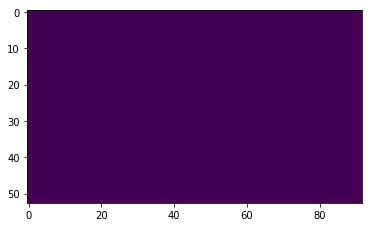

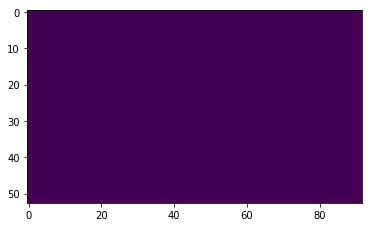

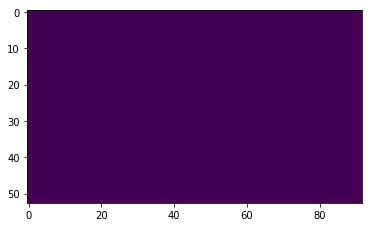

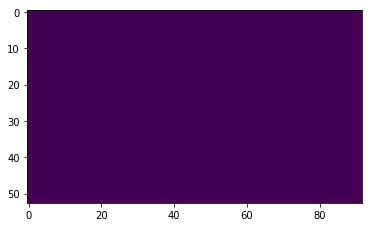

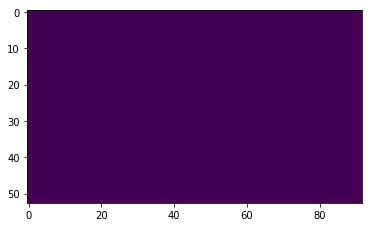

...

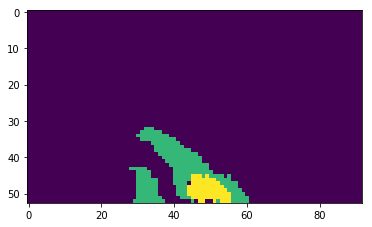

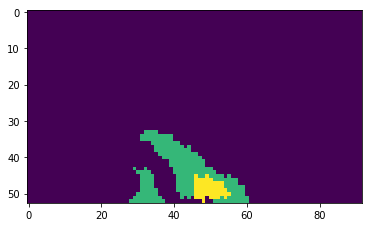

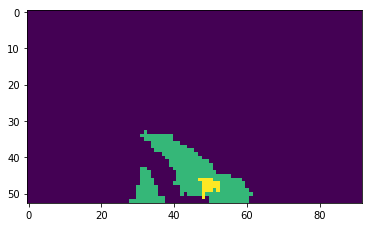

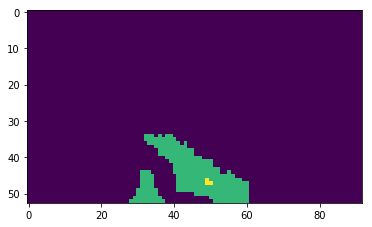

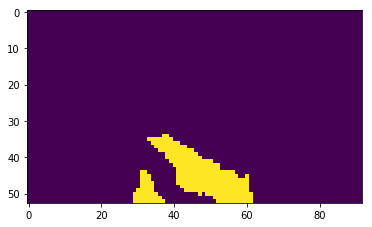

IndexError: index 87 is out of bounds for dimension 2 with size 87

In [248]:

only_masks=msk[h_min:h_max,w_min:w_max,d_min:d_max]
for i in range(0,100):
    plt.imshow(only_masks[:,:,i])
    plt.show()

In [197]:
np.linspace(w_min,w_max,w_max-w_min+1),np.linspace(h_min,h_max,h_max-h_min+1)

(array([108., 109., 110., 111., 112., 113., 114., 115., 116., 117., 118.,
        119., 120., 121., 122., 123., 124., 125., 126., 127., 128., 129.,
        130., 131., 132., 133., 134., 135., 136., 137., 138., 139., 140.,
        141., 142., 143., 144., 145., 146., 147., 148., 149., 150., 151.,
        152., 153., 154., 155., 156., 157., 158., 159., 160., 161., 162.,
        163., 164., 165., 166., 167., 168., 169., 170., 171., 172., 173.,
        174., 175., 176., 177., 178., 179., 180., 181., 182., 183., 184.,
        185., 186., 187., 188., 189., 190., 191., 192., 193., 194., 195.,
        196., 197., 198., 199., 200.]),
 array([ 57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,  66.,  67.,
         68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,  77.,  78.,
         79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,  88.,  89.,
         90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,  99., 100.,
        101., 102., 103., 104., 105., 106., 107., 108., 109., 110.]))

In [244]:
# while height,width != True, True

w1=np.random.randint(0,192-65) +0.0
w2=w1+64

h1=np.random.randint(0,192-65)+0.0
h2=h1+64

d1=np.random.randint(0,128-49)+0.0
d2=d1+48

if w1 and w2 not in np.linspace(w_min,w_max,w_max-w_min+1):
    width=True
if h1 and h2 not in np.linspace(h_min,h_max,h_max-h_min+1):
    height=True




In [245]:
height and width == True

True

In [246]:
width,height,w1,h1,d1,d2

(True, True, 66.0, 7.0, 53.0, 101.0)

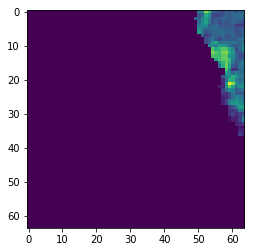

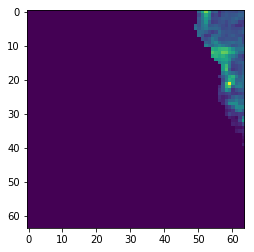

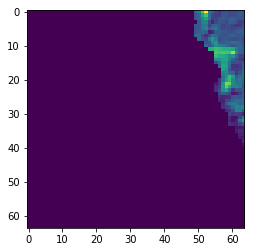

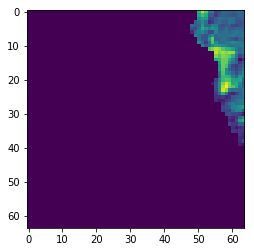

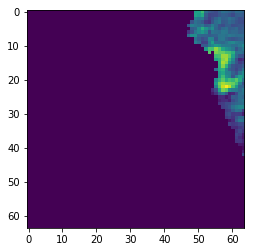

...

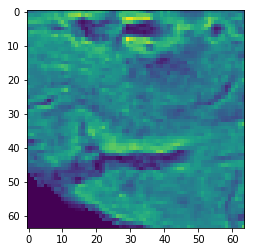

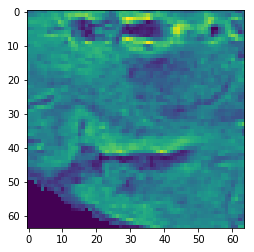

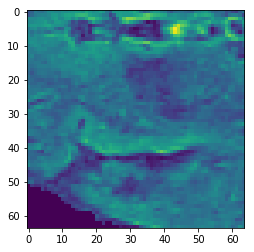

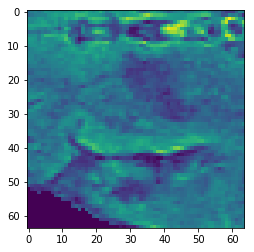

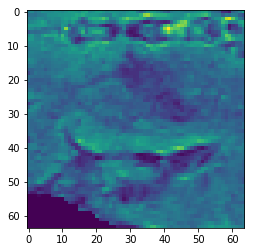

In [243]:

w1,h1,d1,w2,h2,d2=int(w1),int(h1),int(d1),int(w2),int(h2),int(d2)
not_tumor=msk[h1:h2,w1:w2,d1:d2]

not_tumor_img=d['img'][0][h1:h2,w1:w2,d1:d2]

for i in range(0,48):
    plt.imshow(not_tumor_img[:,:,i])
    plt.show()

In [218]:
not_tumor_img.size()

torch.Size([64, 64, 5])

In [6]:
d=next(dsi)
img=torch.clamp(d['img'],0,255)[:,20:212,20:212,15:143].float()
msk=d['seg_orig'][20:212,20:212,15:143]
img.size(),msk.size()

(torch.Size([4, 192, 192, 128]), torch.Size([192, 192, 128]))

In [7]:
x = msk.unsqueeze(0) # dimensions of non-zero Mask as cube


non_zero = (x!=0).nonzero()  # Contains non-zero indices for all 4 dims
h_min = non_zero[:, 1].min()
h_max = non_zero[:, 1].max()
w_min = non_zero[:, 2].min()
w_max = non_zero[:, 2].max()
d_min = non_zero[:, 3].min()
d_max = non_zero[:, 3].max()
print(h_min,h_max,w_min,w_max,d_min,d_max)


(tensor(113), tensor(157), tensor(105), tensor(165), tensor(26), tensor(76))


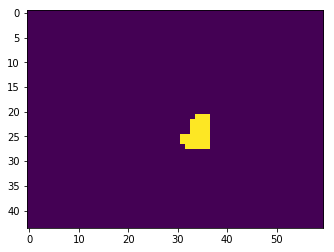

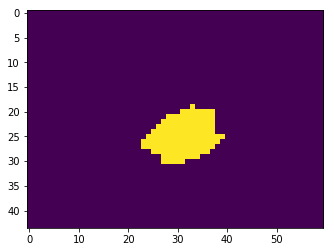

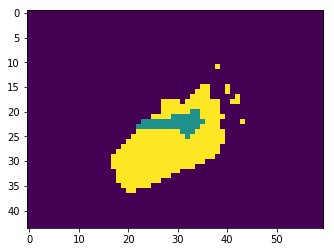

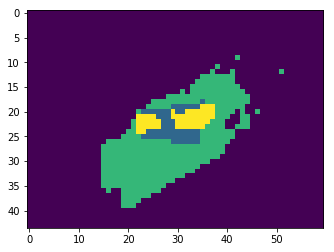

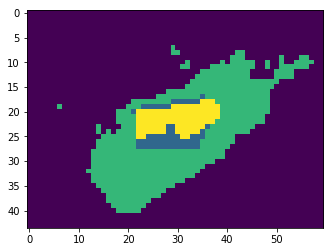

...

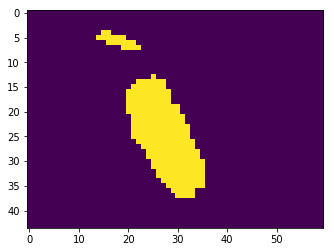

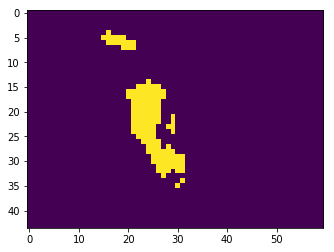

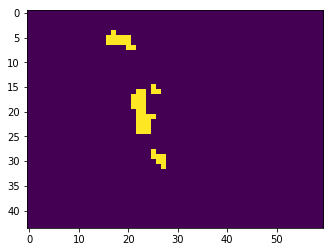

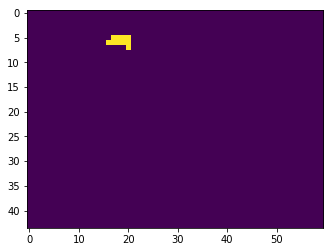

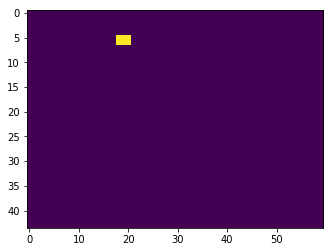

IndexError: index 50 is out of bounds for dimension 2 with size 50

In [8]:
only_masks=msk[h_min:h_max,w_min:w_max,d_min:d_max]
for i in range(0,100):
    plt.imshow(only_masks[:,:,i])
    plt.show()

In [9]:
np.linspace(h_min,h_max,h_max-h_min+1),np.linspace(w_min,w_max,w_max-w_min+1)

(array([113., 114., 115., 116., 117., 118., 119., 120., 121., 122., 123.,
        124., 125., 126., 127., 128., 129., 130., 131., 132., 133., 134.,
        135., 136., 137., 138., 139., 140., 141., 142., 143., 144., 145.,
        146., 147., 148., 149., 150., 151., 152., 153., 154., 155., 156.,
        157.]),
 array([105., 106., 107., 108., 109., 110., 111., 112., 113., 114., 115.,
        116., 117., 118., 119., 120., 121., 122., 123., 124., 125., 126.,
        127., 128., 129., 130., 131., 132., 133., 134., 135., 136., 137.,
        138., 139., 140., 141., 142., 143., 144., 145., 146., 147., 148.,
        149., 150., 151., 152., 153., 154., 155., 156., 157., 158., 159.,
        160., 161., 162., 163., 164., 165.]))

In [37]:
# while height,width != True, True
flag=False
while flag ==False:
    w1=np.random.randint(0,192-65) +0.0
    w2=w1+64

    h1=np.random.randint(0,192-65)+0.0
    h2=h1+64

    d1=np.random.randint(0,128-49)+0.0
    d2=d1+48

    print(w1)
    
    if w1 not in np.linspace(w_min,w_max,w_max-w_min+1) and w2 not in np.linspace(w_min,w_max,w_max-w_min+1):width=True
    else: width=False

    print(h1)

    if h1 not in np.linspace(h_min,h_max,h_max-h_min+1) and h2 not in np.linspace(h_min,h_max,h_max-h_min+1):height=True
    else: height=False

    flag=height and width
    print(flag)

31.0
85.0
False
50.0
13.0
False
54.0
92.0
False
109.0
16.0
False
126.0
41.0
False
90.0
20.0
False
89.0
50.0
False
1.0
121.0
False
91.0
44.0
False
80.0
16.0
False
102.0
117.0
False
51.0
81.0
False
108.0
16.0
False
105.0
26.0
False
30.0
12.0
True


In [22]:
# height and width == True
flag

True

In [23]:
width,height,h1,w1,d1,d2

(True, True, 46.0, 24.0, 71.0, 119.0)

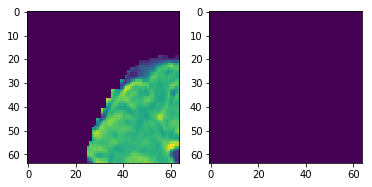

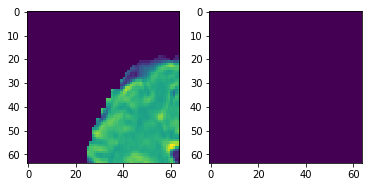

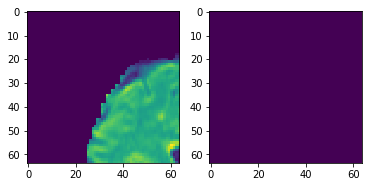

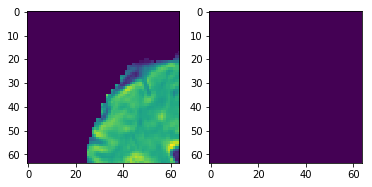

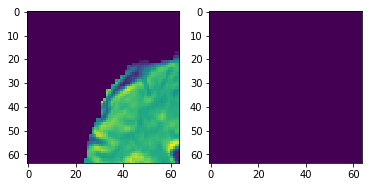

...

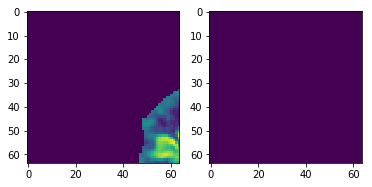

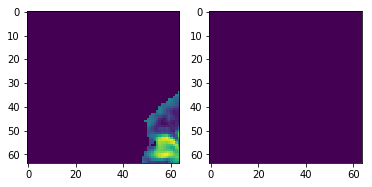

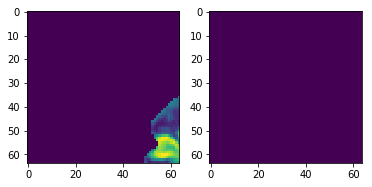

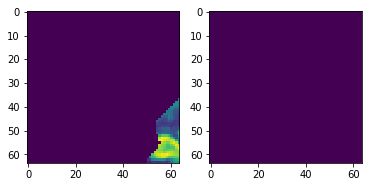

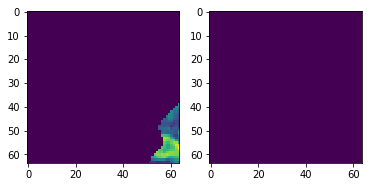

In [24]:
w1,h1,d1,w2,h2,d2=int(w1),int(h1),int(d1),int(w2),int(h2),int(d2)

not_tumor=msk[h1:h2,w1:w2,d1:d2]

not_tumor_img=d['img'][:,h1:h2,w1:w2,d1:d2]

for i in range(0,48):
    plt.subplot(1,2,1)
    plt.imshow(not_tumor_img[0,:,:,i])
    
    plt.subplot(1,2,2)
    plt.imshow(not_tumor[:,:,i])
    plt.show()

In [34]:
# for cropping region with tumor
#h_min:h_max,w_min:w_max,d_min:d_max

wt1=np.random.randint(w_min,w_max-30)  
wt2=wt1+64

ht1=np.random.randint(h_min,h_max-30) 
ht2=ht1+64

dt1=np.random.randint(d_min,d_max-24)
dt2=dt1+48



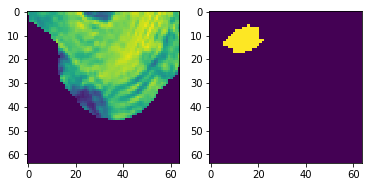

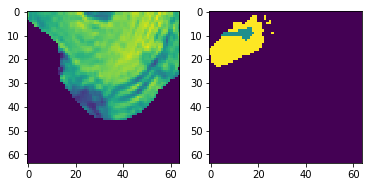

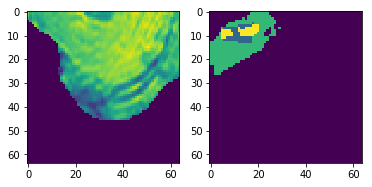

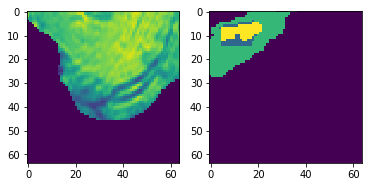

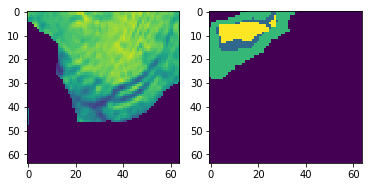

...

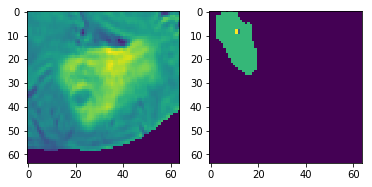

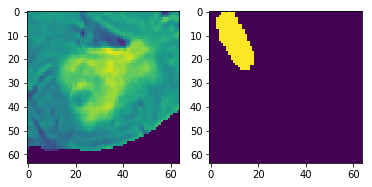

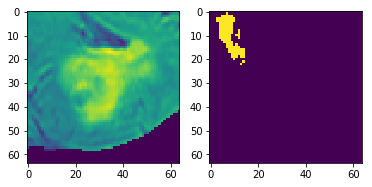

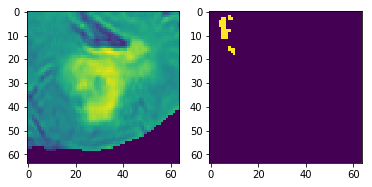

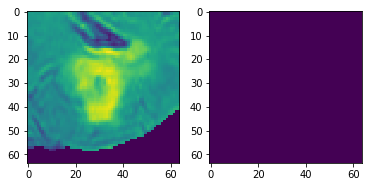

In [36]:
yes_tumor_msk=msk[ht1:ht2,wt1:wt2,dt1:dt2]

yes_tumor_img=d['img'][:,ht1:ht2,wt1:wt2,dt1:dt2]

for i in range(0,48):
    plt.subplot(1,2,1)
    plt.imshow(yes_tumor_img[0,:,:,i])
    
    plt.subplot(1,2,2)
    plt.imshow(yes_tumor_msk[:,:,i])
    plt.show()

In [29]:
yes_tumor_img.size()

torch.Size([4, 64, 64, 48])

In [31]:

a=np.array([25, 23, 30, 27, 24, 25, 26, 28, 25, 19, 34, 58, 29, 38, 41, 15, 23, 30, 23, 28, 26, 25, 41, 23, 19, 33, 26, 26, 26, 29, 30, 23, 23, 25, 28, 31, 15, 29, 30, 24, 19, 26, 36, 27, 28, 31, 26, 33, 31, 23, 23, 23, 23, 26, 25, 40, 26, 30, 30, 25, 32, 19, 23, 29, 32, 25, 25, 35])



b=np.array([134, 138, 135, 134, 135, 138, 128, 134, 139, 138, 134, 138, 124, 139, 138, 135, 138, 127, 128, 130, 138, 138, 135, 126, 135, 138, 122, 133, 132, 130, 138, 122, 140, 129, 132, 132, 134, 128, 139, 138, 134, 136, 134, 138, 125, 142, 131, 134, 131, 138, 138, 142, 135, 121, 128, 139, 138, 134, 140, 131, 134, 138, 126, 139, 137, 128, 131, 134])



In [33]:
max(b-a)

120